# Prepare Enviroment & Dataset




In [ ]:
!pip install pandas numpy matplotlib seaborn scikit-learn tensorflow keras joblib pydot xgboost gensim transformers datasets sentencepiece accelerate evaluate shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 97.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 8.6 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=1b8d06c640db2a13911c1c936f22337f5b7076b627d7cf3ae8d4f68e381a9b2a
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, precision_recall_curve, auc, roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, classification_report

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/DeAnTotNghiep/dataset_cleaned_no_quasi_constant.csv',encoding='latin1')
df.head(10)

NameError: name 'pd' is not defined

In [ ]:
Y1 = df['label']
X1 = df.drop(columns= ['url', 'label'])

In [ ]:
X1.head(2)

,has_short_svc,has_domain_in_brand,nb_at,nb_hyphens,word_raw_len,nb_equal,nb_underscore,has_ip,ratio_digits_host,has_abnormal_subdomain,...,HasTitle,Robots,has_statistical_report,NoOfJS,HasExternalFormSubmit,NoOfEmptyRef,Crypto,NoOfCSS,LargestLineLength,NoOfPopup
0,0,0,0,0,3,0,0,0,0.0,0,...,1,1,0,28,0,0,0,20,9381,0
1,0,0,0,0,4,0,0,0,0.0,0,...,1,1,0,7,0,2,0,2,682,0


In [ ]:
Y1.head(2)

,label
0,1
1,1


In [ ]:
X2 = df['url']
X2.head(2)

,url
0,https://www.southbankmosaics.com
1,https://www.voicefmradio.co.uk


# Evaluation Helpler Functions

In [ ]:
def eval_graph_XGB(results):
    # Kiểm tra sự tồn tại của validation_0
    if 'validation_0' not in results:
        print("Error: Missing validation_0 in results. Check eval_set in fit().")
        return

    epochs = range(len(results['validation_0']['logloss']))

    # Biểu đồ Accuracy
    plt.figure(figsize=(14, 7))
    plt.plot(epochs, [1 - x for x in results['validation_0']['error']], 'b', label='Train Accuracy (1 - Error)')
    if 'validation_1' in results:
        plt.plot(epochs, [1 - x for x in results['validation_1']['error']], 'r', label='Test Accuracy (1 - Error)')
    plt.legend(loc='upper left')
    plt.title("ACCURACY GRAPH (XGBoost)")
    plt.xlabel("Iteration")
    plt.ylabel("Accuracy")
    plt.show()

    # Biểu đồ Log Loss
    plt.figure(figsize=(14, 7))
    plt.plot(epochs, results['validation_0']['logloss'], 'b', label='Train Log Loss')
    if 'validation_1' in results:
        plt.plot(epochs, results['validation_1']['logloss'], 'r', label='Test Log Loss')
    plt.legend(loc='upper left')
    plt.title("LOSS GRAPH (XGBoost)")
    plt.xlabel("Iteration")
    plt.ylabel("Log Loss")
    plt.show()

    # Biểu đồ PR-AUC
    if 'aucpr' in results['validation_0']:
        plt.figure(figsize=(14, 7))
        plt.plot(epochs, results['validation_0']['aucpr'], 'b', label='Train PR-AUC')
        if 'validation_1' in results and 'aucpr' in results['validation_1']:
            plt.plot(epochs, results['validation_1']['aucpr'], 'r', label='Test PR-AUC')
        plt.legend(loc='upper left')
        plt.title("PR-AUC GRAPH (XGBoost)")
        plt.xlabel("Iteration")
        plt.ylabel("PR-AUC")
        plt.show()
    else:
        print("Warning: PR-AUC metric not found in results. Ensure 'aucpr' is in eval_metric.")


In [ ]:
def conf_matrix_XGB(X_test, y_test, model, label_names=['phishing', 'benign']):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)

    # Vẽ Confusion Matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
    disp.plot(cmap=plt.cm.YlGn)
    plt.title('CONFUSION MATRIX (XGBoost)')
    plt.show()

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=label_names))

    # Predict proba cho metrics
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Tính PR-AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    pr_auc = auc(recall, precision)
    print(f"PR-AUC (Test): {pr_auc:.4f}")

    # Tính ROC-AUC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    print(f"ROC-AUC (Test): {roc_auc:.4f}")

In [ ]:
# def conf_matrix_RF(X_test, y_test, model, label_names=['phishing', 'benign']):
#     y_pred = model.predict(X_test)
#     cm = confusion_matrix(y_test, y_pred)

#     disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
#     disp.plot(cmap=plt.cm.YlGn)
#     plt.title("CONFUSION MATRIX (RandomForest)")
#     plt.show()

#     # Classification report
#     print("\nClassification Report:")
#     print(classification_report(y_test, y_pred, target_names=label_names))

#     # Accuracy riêng
#     acc = np.mean(y_pred == y_test)
#     print(f"Accuracy (Test): {acc:.4f}")

In [ ]:
def conf_matrix_RF(
    X_test, y_test, model,
    label_names=('phishing','benign'),
    thousands=False
):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.ticker as mticker
    from sklearn.metrics import (
        confusion_matrix, ConfusionMatrixDisplay, classification_report,
        accuracy_score, f1_score, precision_recall_curve, roc_curve,
        roc_auc_score, auc
    )

    # 1) y_test -> 1D
    y_true = np.asarray(y_test).ravel()

    # 2) predict
    y_pred = model.predict(X_test)

    # 3) xác định thứ tự nhãn để vẽ/ báo cáo
    uniques = np.unique(y_true)
    try:
        if set(uniques.astype(float).tolist()) == {0.0, 1.0}:
            labels = np.array([0, 1])
            display_labels = list(label_names)
        else:
            labels = uniques
            display_labels = uniques.astype(str).tolist()
    except Exception:
        labels = uniques
        display_labels = uniques.astype(str).tolist()

    # 4) Confusion Matrix
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    # 5) Vẽ CM: số nguyên, bỏ ký hiệu khoa học
    fig, ax = plt.subplots(figsize=(6,5), dpi=140)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
    disp.plot(ax=ax, cmap=plt.cm.YlGn, values_format='d', colorbar=True)
    ax.set_title("CONFUSION MATRIX (RandomForest)")
    ax.set_xlabel("Predicted label"); ax.set_ylabel("True label")

    if disp.im_.colorbar is not None:
        disp.im_.colorbar.formatter = mticker.StrMethodFormatter('{x:.0f}')
        disp.im_.colorbar.update_ticks()

    # (tuỳ chọn) hiển thị 20,000 thay vì 20000
    if thousands:
        for t in ax.texts: t.set_visible(False)
        vmax = cm.max()
        for (i, j), v in np.ndenumerate(cm):
            color = 'white' if v > vmax/2 else 'black'
            ax.text(j, i, f'{int(v):,}', ha='center', va='center', color=color)

    plt.tight_layout(); plt.show()

    # 6) Classification report
    try:
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred, labels=labels,
                                    target_names=display_labels, digits=4))
    except Exception:
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred, digits=4))

    # 7) Accuracy & F1
    acc = accuracy_score(y_true, y_pred)
    f1_macro = f1_score(y_true, y_pred, average='macro')
    f1_micro = f1_score(y_true, y_pred, average='micro')
    f1_weighted = f1_score(y_true, y_pred, average='weighted')
    print(f"Accuracy (Test): {acc:.4f}")
    print(f"F1-Score (Macro): {f1_macro:.4f}")
    print(f"F1-Score (Micro): {f1_micro:.4f}")
    print(f"F1-Score (Weighted): {f1_weighted:.4f}")

    # 8) PR-AUC & ROC-AUC (nếu nhãn là 0/1 và có predict_proba)
    if hasattr(model, "predict_proba") and set(np.unique(y_true)).issubset({0,1}):
        try:
            y_prob = model.predict_proba(X_test)[:, 1]
            precision, recall, _ = precision_recall_curve(y_true, y_prob)
            pr_auc = auc(recall, precision)
            fpr, tpr, _ = roc_curve(y_true, y_prob)
            roc_auc = roc_auc_score(y_true, y_prob)
            print(f"PR-AUC (Test): {pr_auc:.4f}")
            print(f"ROC-AUC (Test): {roc_auc:.4f}")
        except Exception:
            pass

    return cm


In [ ]:
def pr_roc_RF(X_test, y_test, model):
    """Vẽ ROC curve và PR curve cho RandomForest"""
    # predict_proba trả ra xác suất cho mỗi lớp
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC-AUC = {roc_auc:.4f}")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC CURVE (RandomForest)")
    plt.legend()
    plt.show()

    # Precision-Recall
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    pr_auc = auc(recall, precision)
    plt.figure(figsize=(7, 6))
    plt.plot(recall, precision, label=f"PR-AUC = {pr_auc:.4f}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("PRECISION-RECALL CURVE (RandomForest)")
    plt.legend()
    plt.show()

    print(f"ROC-AUC (Test): {roc_auc:.4f}")
    print(f"PR-AUC  (Test): {pr_auc:.4f}")

In [ ]:
def feature_importance_RF(model, feature_names=None, top_n=20):
    """Vẽ top-n feature importance cho RandomForest"""
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1][:top_n]

    if feature_names is None:
        feature_names = [f"f{i}" for i in range(len(importances))]

    plt.figure(figsize=(10, 6))
    plt.bar(range(top_n), importances[indices], align='center')
    plt.xticks(range(top_n), [feature_names[i] for i in indices], rotation=45, ha='right')
    plt.title(f"Top-{top_n} Feature Importances (RandomForest)")
    plt.tight_layout()
    plt.show()

In [ ]:
def conf_matrix_KNN_SVM(X_test, y_test, model, model_name, label_names=['phishing', 'benign']):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
    disp.plot(cmap=plt.cm.YlGn)
    plt.title(f"Confusion Matrix {model_name}")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    plt.show()

In [ ]:
def pr_roc_KNN_SVM(X_test, y_test, model, model_name="Model"):
    # Nếu y_test là one-hot thì chuyển về vector nhãn
    if len(y_test.shape) > 1 and y_test.shape[1] == 2:
        y_test = np.argmax(y_test, axis=1)

    # Lấy xác suất class 1
    if hasattr(model, "predict_proba"):
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_pred_proba = model.decision_function(X_test)

    # ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    # PR curve
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    pr_auc = auc(recall, precision)

    plt.figure(figsize=(12,5))

    # ROC
    plt.subplot(1,2,1)
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
    plt.plot([0,1],[0,1],"--", color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve - {model_name}")
    plt.legend()

    # PR
    plt.subplot(1,2,2)
    plt.plot(recall, precision, label=f"AUC = {pr_auc:.4f}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"Precision-Recall Curve - {model_name}")
    plt.legend()

    plt.show()

    print(f"[{model_name}] ROC-AUC = {roc_auc:.4f}, PR-AUC = {pr_auc:.4f}")


In [ ]:
def eval_graph_CNN(results):

    acc = results.history['accuracy']
    val_acc = results.history['val_accuracy']
    epochs = range(len(acc))
    fig = plt.figure(figsize=(14,7))
    plt.plot(epochs,acc,'r',label="Training Accuracy")
    plt.plot(epochs,val_acc,'b',label="Validation Accuracy")
    plt.legend(loc='upper left')
    plt.title("ACCURACY GRAPH")
    plt.show()

    loss = results.history['loss']
    val_loss = results.history['val_loss']
    epochs = range(len(loss))
    fig = plt.figure(figsize=(14,7))
    plt.plot(epochs,loss,'r',label="Training loss")
    plt.plot(epochs,val_loss,'b',label="Validation loss")
    plt.legend(loc='upper left')
    plt.title("LOSS GRAPH")
    plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import f1_score as sk_f1_score

def conf_matrix_CNN(X_test, Y_test, model, label_names=['phishing', 'benign']):
    # reshape nếu cần
    X_test = np.array(X_test)
    if len(X_test.shape) == 2:
        X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

    # dự đoán nhãn (binary: threshold 0.5)
    Y_pred_proba = model.predict(X_test).ravel()
    Y_pred = (Y_pred_proba > 0.5).astype(int)

    # ground truth
    Y_test_labels = np.array(Y_test).astype(int)

    # confusion matrix
    cm = confusion_matrix(Y_test_labels, Y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
    disp.plot(cmap=plt.cm.YlGn)
    plt.title('CONFUSION MATRIX')
    plt.show()

    # F1-score
    f1 = sk_f1_score(Y_test_labels, Y_pred, average='binary')
    print(f"F1-Score: {f1:.4f}")


In [ ]:
def pr_roc_CNN(X_test, Y_test, model):
    # đảm bảo numpy array
    X_test = np.array(X_test)
    Y_test = np.array(Y_test).astype(int)

    # reshape nếu cần
    if len(X_test.shape) == 2:
        X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

    # dự đoán xác suất
    Y_pred_proba = model.predict(X_test).ravel()

    # --- Precision-Recall ---
    precision, recall, _ = precision_recall_curve(Y_test, Y_pred_proba)
    pr_auc = auc(recall, precision)

    plt.figure(figsize=(7, 6))
    plt.plot(recall, precision, label=f'PR-AUC = {pr_auc:.4f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (CNN/CNN_LSTM)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # --- ROC Curve ---
    fpr, tpr, _ = roc_curve(Y_test, Y_pred_proba)
    roc_auc = roc_auc_score(Y_test, Y_pred_proba)

    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f'ROC-AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (CNN/CNN_LSTM)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    print(f"PR-AUC : {pr_auc:.4f}")
    print(f"ROC-AUC: {roc_auc:.4f}")
    return pr_auc, roc_auc

In [ ]:
def conf_matrix_ALBERT(y_true, y_pred, label_names=["phishing","benign"]):
  cm = confusion_matrix(y_true, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
  disp.plot(cmap=plt.cm.YlGn)
  plt.title("Confusion Matrix (ALBERT)")
  plt.show()

In [ ]:
def pr_roc_ALBERT(y_true, y_pred_proba):
  # === ROC Curve ===
  fpr, tpr, _ = roc_curve(y_true, y_probs)
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label=f"ROC curve (area = {roc_auc:.2f})")
  plt.plot([0,1],[0,1],"--",color="gray")
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate (Recall)")
  plt.title("ROC Curve")
  plt.legend()
  plt.show()

  # === Precision-Recall Curve ===
  prec, rec, _ = precision_recall_curve(y_true, y_probs)
  plt.plot(rec, prec, label=f"PR curve (AP = {average_precision_score(y_true,y_probs):.2f})")
  plt.xlabel("Recall")
  plt.ylabel("Precision")
  plt.title("Precision-Recall Curve")
  plt.legend()
  plt.show()

In [ ]:
def eval_graph_ALBERT(history):
  plt.plot(history["step"], history["loss"], label="train loss")
  if "eval_loss" in history:
      eval_history = history.dropna(subset=["eval_loss"])
      plt.plot(eval_history["step"], eval_history["eval_loss"], label="eval loss")
  plt.xlabel("Step")
  plt.ylabel("Loss")
  plt.title("Training vs Validation Loss")
  plt.legend()
  plt.show()

  # Nếu bạn log cả metrics (eval_accuracy, eval_f1, …) bạn có thể vẽ tương tự
  if "eval_f1" in history:
      plt.plot(eval_history["epoch"], eval_history["eval_f1"], marker="o")
      plt.xlabel("Epoch")
      plt.ylabel("F1-score")
      plt.title("Validation F1 over Epochs")
      plt.show()

# XGB Model

In [ ]:
import xgboost as xgb
from xgboost import plot_tree
from xgboost import XGBClassifier
from xgboost import plot_importance

xgb = XGBClassifier(
    objective='binary:logistic',
    learning_rate=0.08,
    n_estimators=300,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.5,
    reg_alpha=0.5,
    eval_metric=['logloss', 'error', 'aucpr'],
    random_state=42,
    n_jobs=-1
)

# Random Forest Model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(
    n_estimators=100,
    max_depth=15,
    min_samples_split=5,
    min_samples_leaf=1,
    max_features='sqrt',
    bootstrap=True,
    n_jobs=-1,
    random_state=42
)

# KNN Model

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
KNN = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier(n_neighbors=5, metric='minkowski'))
])

# SVM Model

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
SVM = Pipeline([
    ("scaler", StandardScaler()),
    ("svm", SVC(kernel="rbf", probability=True))
])

# BiLSTM Model

In [ ]:
from keras import layers, Sequential
def BiLSTM(input_size):
    model = Sequential()
    model.add(layers.Input(input_size))
    model.add(layers.Bidirectional(layers.LSTM(64, return_sequences=True)))
    model.add(layers.Bidirectional(layers.LSTM(32)))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

BiLSTM_model1 = BiLSTM((64,1))
BiLSTM_model2 = BiLSTM((50,1))
BiLSTM_model1.summary()
BiLSTM_model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ (None, 64, 128)        │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,233 (309.50 KB)

 Trainable params: 79,233 (309.50 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_2 (Bidirectional) │ (None, 50, 128)        │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,233 (309.50 KB)

 Trainable params: 79,233 (309.50 KB)

 Non-trainable params: 0 (0.00 B)

# CNN Model

In [ ]:
from keras import layers, Sequential

def CNN(input_size):
    model = Sequential()
    model.add(layers.Input(input_size))

    model.add(layers.Conv1D(32, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size=2, padding='same'))

    model.add(layers.Conv1D(64, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size=2, padding='same'))

    model.add(layers.Conv1D(128, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())

    model.add(layers.Flatten())

    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

CNN_model1 = CNN((64,1))
CNN_model2 = CNN((50,1))
CNN_model1.summary()
CNN_model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 64, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 32, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 32, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 16, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 16, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 294,337 (1.12 MB)

 Trainable params: 293,889 (1.12 MB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 50, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 50, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 50, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 25, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 25, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 25, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 25, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 13, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 13, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 13, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 13, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       213,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 245,185 (957.75 KB)

 Trainable params: 244,737 (956.00 KB)

 Non-trainable params: 448 (1.75 KB)

# CNN-LSTM Model

In [ ]:
from keras import layers, Sequential

def CNN_LSTM(input_size):
    model = Sequential()
    model.add(layers.Input(input_size))

    model.add(layers.Conv1D(32, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size=2, padding='same'))

    model.add(layers.Conv1D(64, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling1D(pool_size=2, padding='same'))

    model.add(layers.Conv1D(128, kernel_size=3, activation='relu', padding='same'))
    model.add(layers.Dropout(0.2))
    model.add(layers.BatchNormalization())

    # Thay GlobalMaxPooling1D bằng LSTM
    model.add(layers.LSTM(64, return_sequences=False))

    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))

    return model

CNN_LSTM_model1 = CNN_LSTM((64,1))
CNN_LSTM_model2 = CNN_LSTM((50,1))
CNN_LSTM_model1.summary()
CNN_LSTM_model2.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)               │ (None, 64, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 64, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 32, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 32, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 32, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_8 (Conv1D)               │ (None, 16, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 16, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 16, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 89,793 (350.75 KB)

 Trainable params: 89,345 (349.00 KB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_9 (Conv1D)               │ (None, 50, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 50, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 50, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 25, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 25, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 25, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 25, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 13, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 13, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 13, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 13, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 89,793 (350.75 KB)

 Trainable params: 89,345 (349.00 KB)

 Non-trainable params: 448 (1.75 KB)

# Prepare Train/Test For XGB/RF/KNN/SVM (Numerical)

In [ ]:
from sklearn.model_selection import train_test_split
X_train1,X_test1,Y_train1,Y_test1 = train_test_split(X1,Y1,stratify = Y1,test_size = 0.2,random_state = 42)

In [ ]:
X_train1.to_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv", index=False)
X_test1.to_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv", index=False)
Y_train1.to_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv", index=False)
Y_test1.to_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv", index=False)

In [ ]:
print(X_train1.shape,Y_train1.shape)
print(X_test1.shape,Y_test1.shape)

(157592, 64) (157592,)
(39398, 64) (39398,)


# Training & Evaluation XGB Models With Numerical-Features

In [ ]:
X_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv")
X_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv")
Y_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv")
Y_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv")

eval_set = [(X_train1, Y_train1), (X_test1, Y_test1)]  # Cả train và test
xgb.fit(
    X_train1, Y_train1,
    eval_set=eval_set,
    verbose=50
)

[0]	validation_0-logloss:0.61716	validation_0-error:0.00271	validation_0-aucpr:0.99944	validation_1-logloss:0.61712	validation_1-error:0.00244	validation_1-aucpr:0.99947
[50]	validation_0-logloss:0.00927	validation_0-error:0.00013	validation_0-aucpr:1.00000	validation_1-logloss:0.00957	validation_1-error:0.00025	validation_1-aucpr:1.00000
[100]	validation_0-logloss:0.00043	validation_0-error:0.00003	validation_0-aucpr:1.00000	validation_1-logloss:0.00080	validation_1-error:0.00018	validation_1-aucpr:1.00000
[150]	validation_0-logloss:0.00014	validation_0-error:0.00002	validation_0-aucpr:1.00000	validation_1-logloss:0.00052	validation_1-error:0.00015	validation_1-aucpr:1.00000
[200]	validation_0-logloss:0.00009	validation_0-error:0.00001	validation_0-aucpr:1.00000	validation_1-logloss:0.00047	validation_1-error:0.00015	validation_1-aucpr:1.00000
[250]	validation_0-logloss:0.00008	validation_0-error:0.00001	validation_0-aucpr:1.00000	validation_1-logloss:0.00045	validation_1-error:0.0001

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False,
              eval_metric=['logloss', 'error', 'aucpr'], feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.08, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=-1, num_parallel_tree=None, ...)

In [ ]:
results = xgb.evals_result()

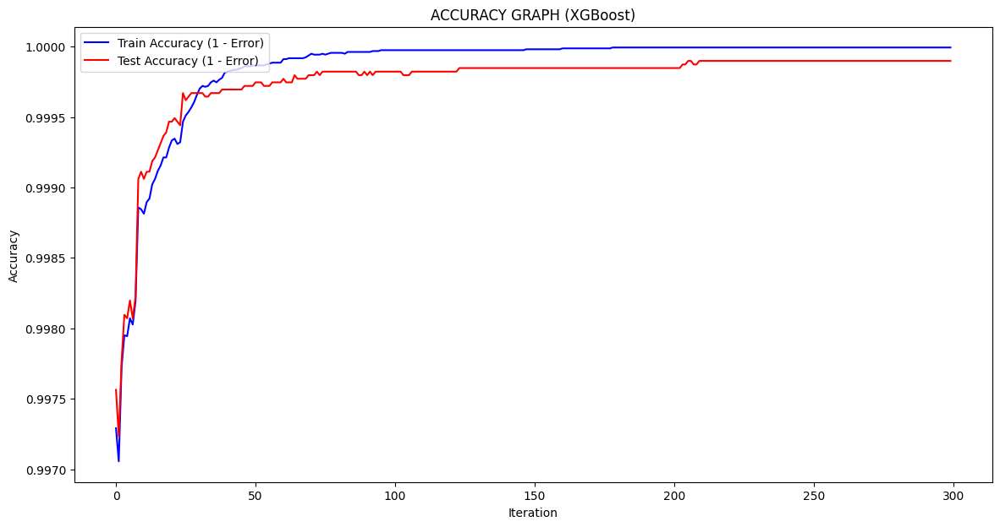

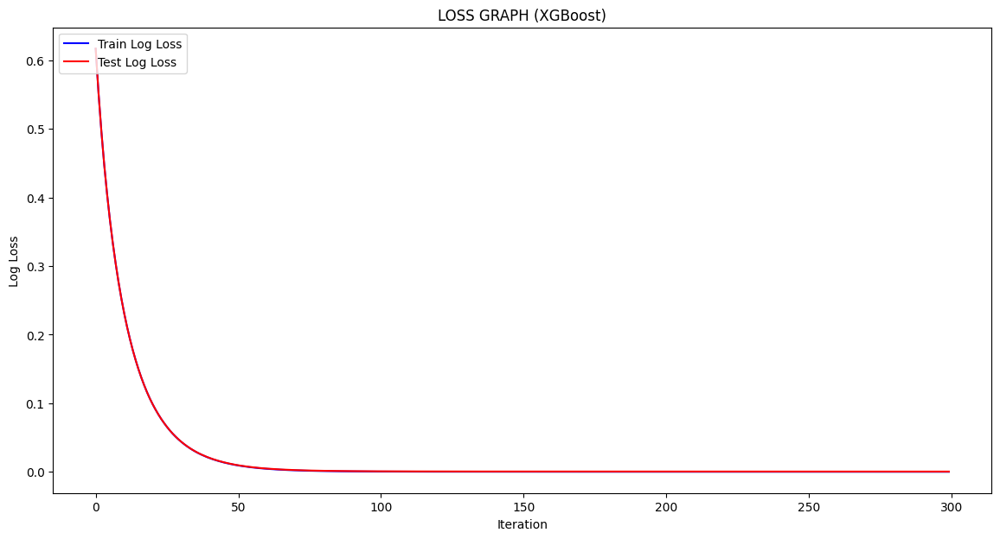

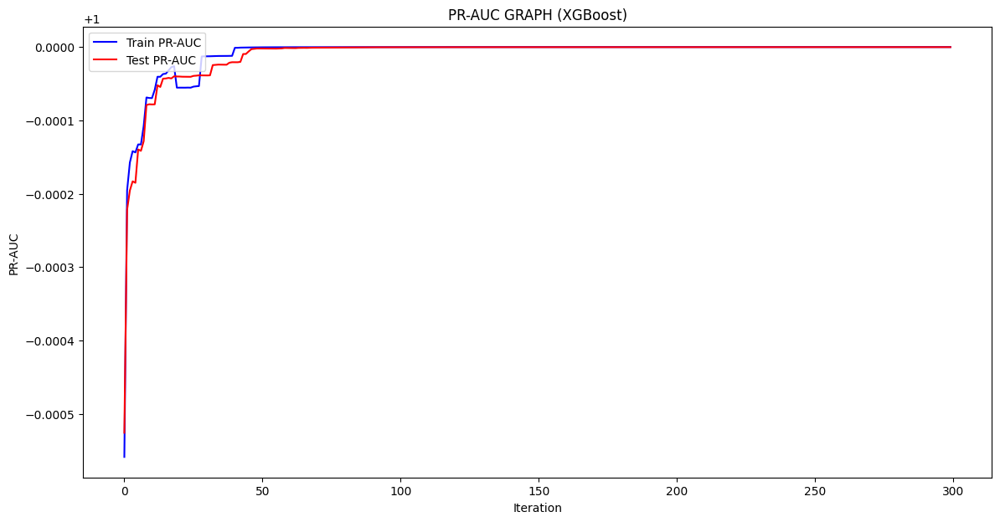

In [ ]:
eval_graph_XGB(results)

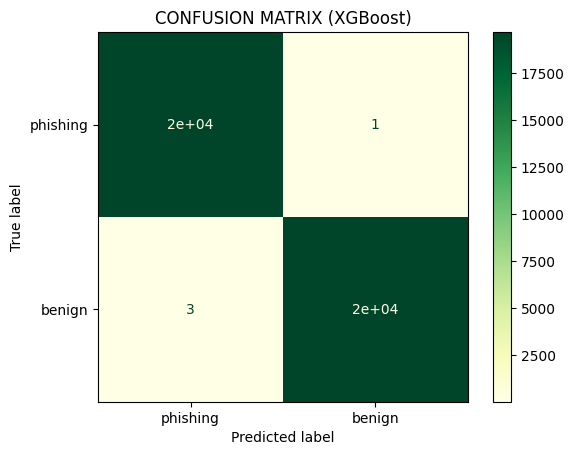


Classification Report:
              precision    recall  f1-score   support

    phishing       1.00      1.00      1.00     19699
      benign       1.00      1.00      1.00     19699

    accuracy                           1.00     39398
   macro avg       1.00      1.00      1.00     39398
weighted avg       1.00      1.00      1.00     39398

PR-AUC (Test): 1.0000
ROC-AUC (Test): 1.0000


In [ ]:
conf_matrix_XGB(X_test1, Y_test1, xgb, label_names=['phishing', 'benign'])

In [ ]:
xgb.save_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_XGB_Numerical.json")

# XGB Explaination Using SHAP (Numerical)

In [ ]:
import shap
import joblib
import xgboost as xgb
xgb = xgb.XGBClassifier()
X_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv")
X_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv")
Y_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv")
Y_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv")
xgb.load_model('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_XGB_Numerical.json')
explainer_xgb = shap.TreeExplainer(xgb)
shap_values_xgb = explainer_xgb.shap_values(X_test1)

ValueError: could not convert string to float: '[5E-1]'

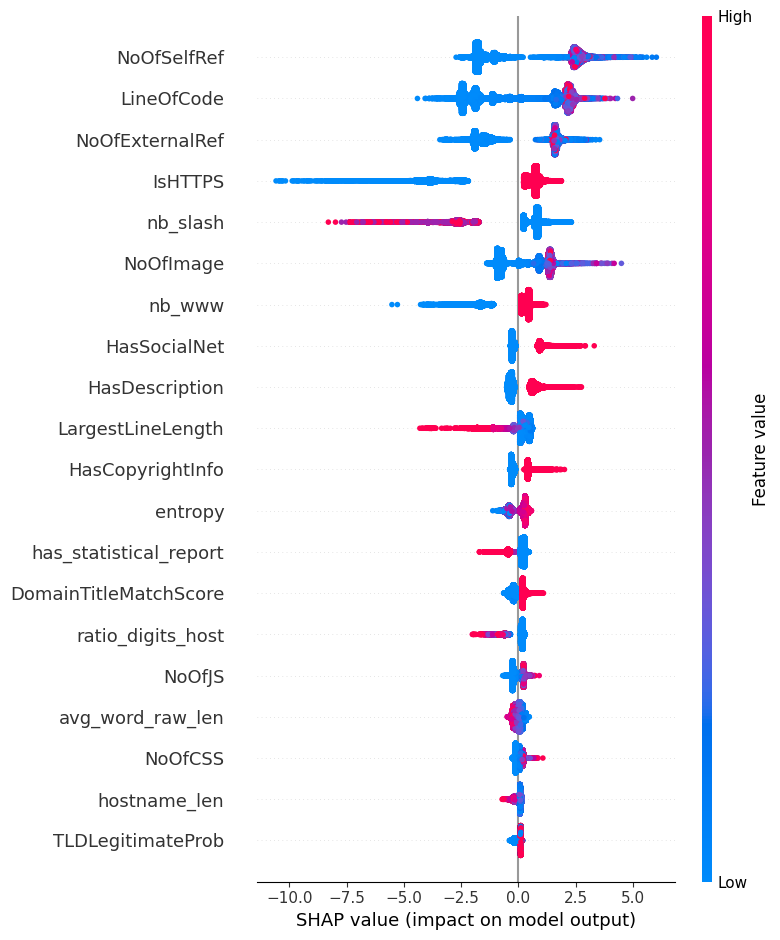

In [ ]:
shap.summary_plot(shap_values_xgb, X_test1)

In [ ]:
shap.initjs()
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[57,:], X_test1.iloc[57,:])

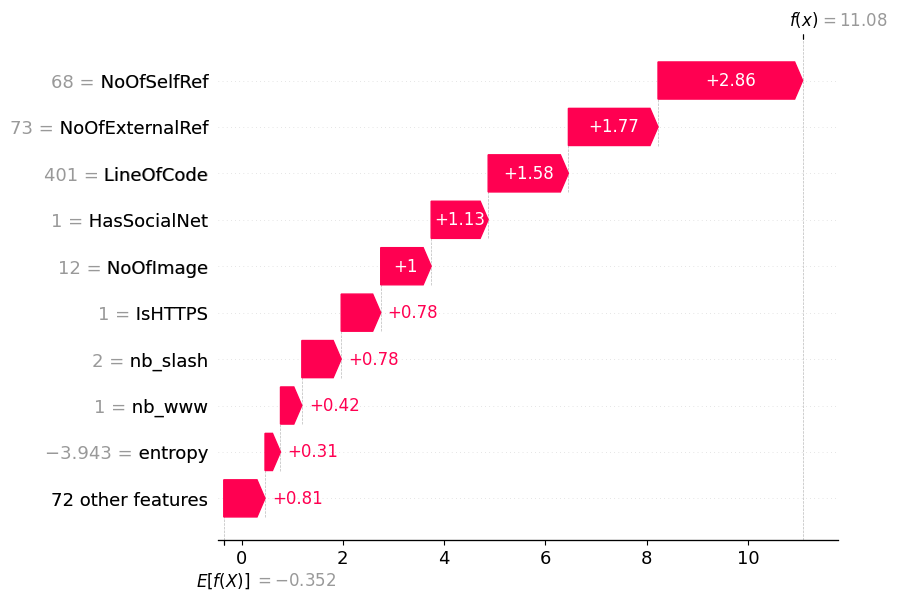

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_xgb[57],
        base_values=explainer_xgb.expected_value,
        data=X_test1.iloc[57],
        feature_names=X_test1.columns
    )
)

In [ ]:
print(Y_test1.iloc[57])

1


In [ ]:
shap.initjs()
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[38,:], X_test1.iloc[57,:])

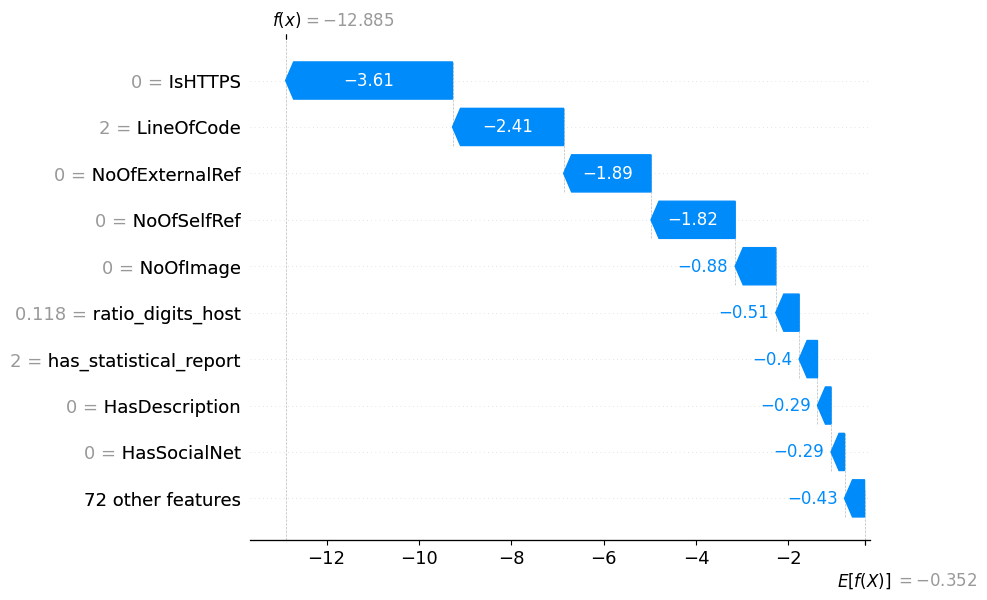

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values_xgb[38],
        base_values=explainer_xgb.expected_value,
        data=X_test1.iloc[38],
        feature_names=X_test1.columns
    )
)

In [ ]:
print(Y_test1.iloc[38])

0


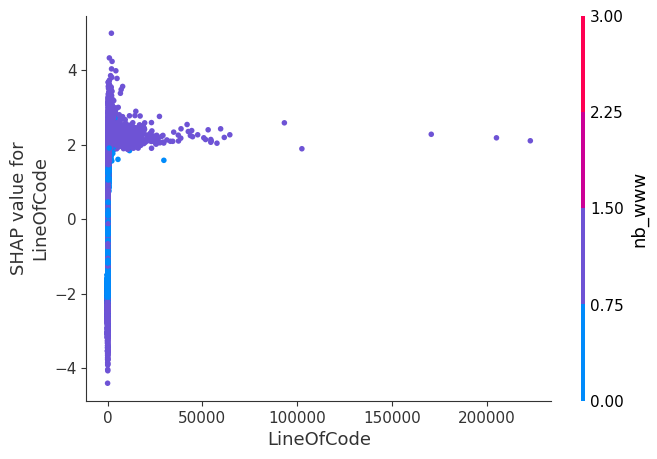

In [ ]:
shap.dependence_plot("LineOfCode", shap_values_xgb, X_test1)

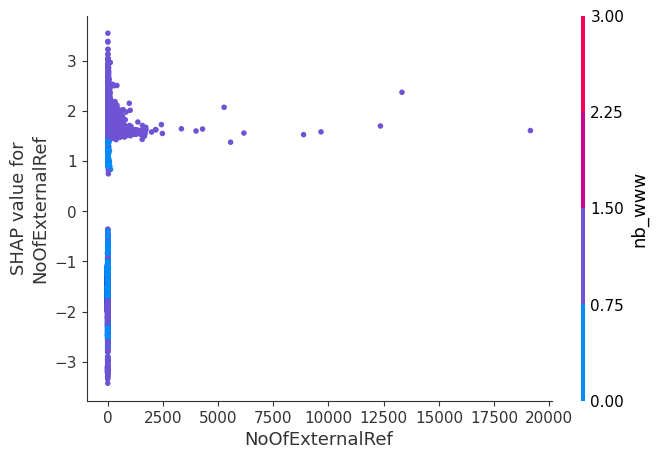

In [ ]:
shap.dependence_plot("NoOfExternalRef", shap_values_xgb, X_test1)

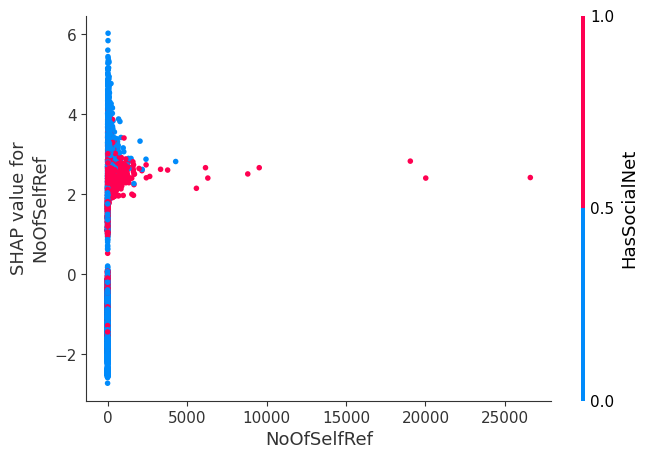

In [ ]:
shap.dependence_plot("NoOfSelfRef", shap_values_xgb, X_test1)

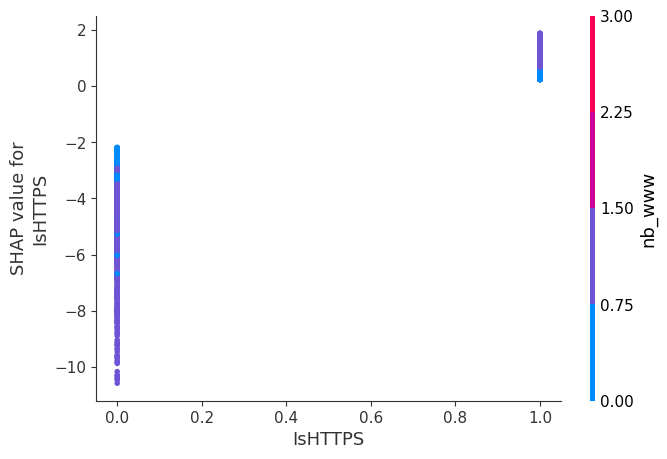

In [ ]:
shap.dependence_plot("IsHTTPS", shap_values_xgb, X_test1)

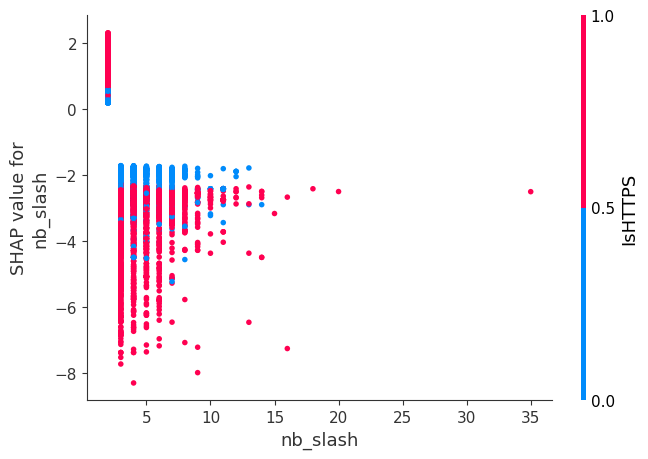

In [ ]:
shap.dependence_plot("nb_slash", shap_values_xgb, X_test1)

LineOfCode → màu theo nb_www

→ tức là số dòng code (LineOfCode) có mối quan hệ với số lần xuất hiện "www" trong URL (nb_www).

Nếu giá trị nb_www khác nhau thì cùng một số dòng code có thể tác động khác nhau đến dự đoán.

Ví dụ: URL có nhiều "www" + nhiều dòng code có thể làm tăng nguy cơ phishing.

NoOfExternalRef → màu theo nb_www
→ tức là số lượng external reference thường đi kèm với số lần "www".

Nếu nb_www cao thì tác động của external ref có thể mạnh hơn.

NoOfSelfRef → màu theo HasSocialNet
→ tức là số lượng internal reference (self reference) có quan hệ chặt với việc URL có chứa liên kết mạng xã hội (HasSocialNet).

Có thể mô hình “học” được rằng: nếu trang có nhiều self-ref và có social net thì khả năng hợp pháp/phishing sẽ thay đổi rõ rệt.

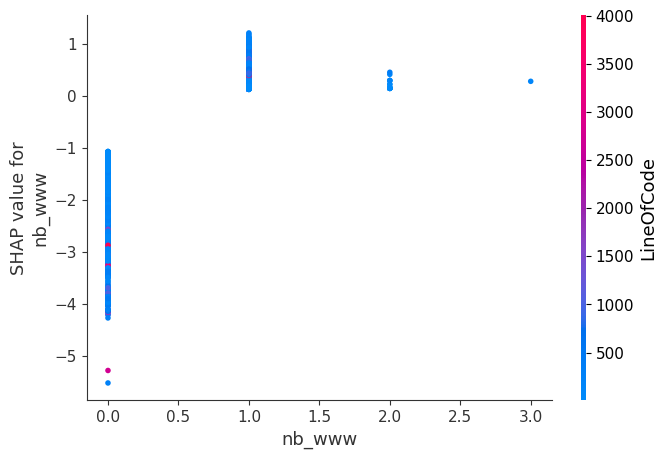

In [ ]:
shap.dependence_plot("nb_www", shap_values_xgb, X_test1, interaction_index="LineOfCode")

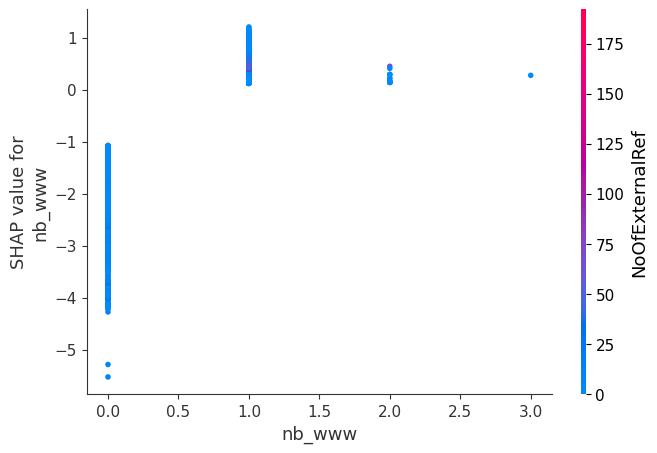

In [ ]:
shap.dependence_plot("nb_www", shap_values_xgb, X_test1, interaction_index="NoOfExternalRef")

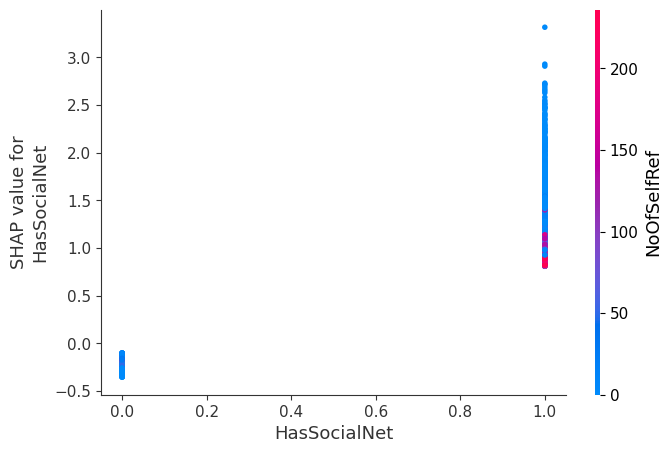

In [ ]:
shap.dependence_plot("HasSocialNet", shap_values_xgb, X_test1, interaction_index="NoOfSelfRef")

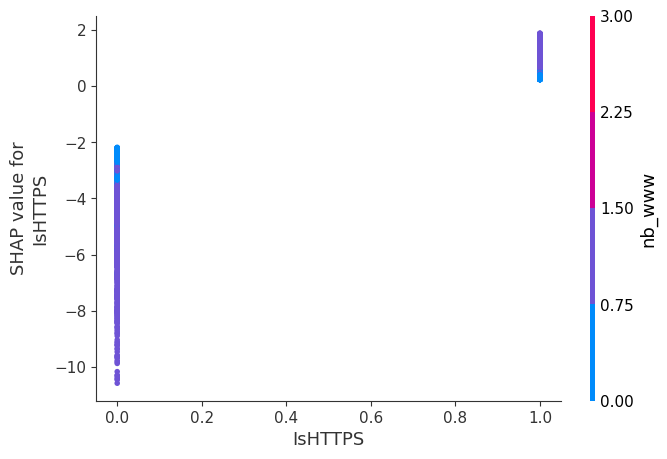

In [ ]:
shap.dependence_plot("IsHTTPS", shap_values_xgb, X_test1, interaction_index="nb_www")

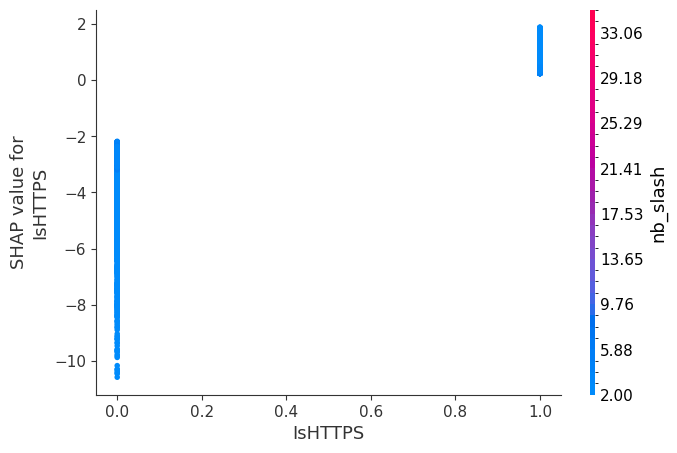

In [ ]:
shap.dependence_plot("IsHTTPS", shap_values_xgb, X_test1, interaction_index="nb_slash")

# Training & Evaluation RF With Numerical-Features

In [ ]:
X_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv")
X_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv")
Y_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv")
Y_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv")

RF.fit(X_train1, Y_train1)

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(max_depth=15, min_samples_split=5, n_jobs=-1,
                       random_state=42)

In [ ]:
#import joblib
#RF = joblib.load('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_RF_NUMERICAL.pkl')

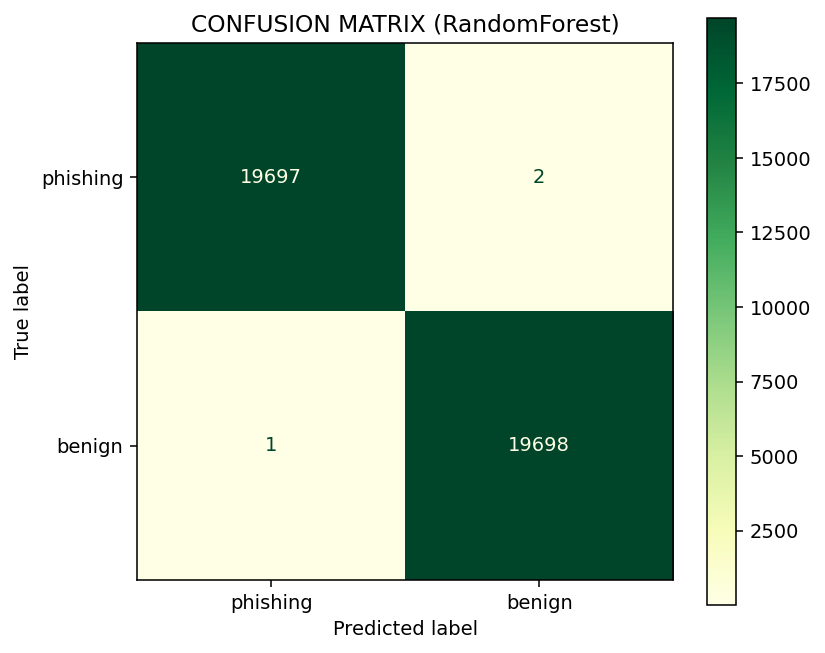


Classification Report:
              precision    recall  f1-score   support

    phishing     0.9999    0.9999    0.9999     19699
      benign     0.9999    0.9999    0.9999     19699

    accuracy                         0.9999     39398
   macro avg     0.9999    0.9999    0.9999     39398
weighted avg     0.9999    0.9999    0.9999     39398

Accuracy (Test): 0.9999
F1-Score (Macro): 0.9999
F1-Score (Micro): 0.9999
F1-Score (Weighted): 0.9999
PR-AUC (Test): 1.0000
ROC-AUC (Test): 1.0000


array([[19697,     2],
       [    1, 19698]])

In [ ]:
conf_matrix_RF(X_test1, Y_test1, RF, label_names=['phishing', 'benign'])

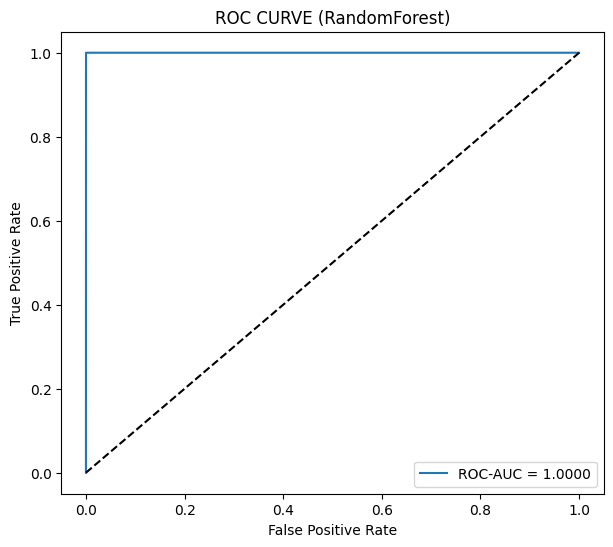

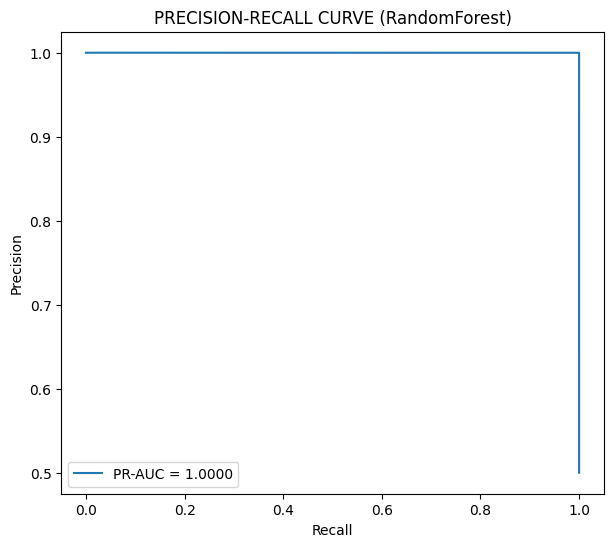

ROC-AUC (Test): 1.0000
PR-AUC  (Test): 1.0000


In [ ]:
pr_roc_RF(X_test1, Y_test1, RF)

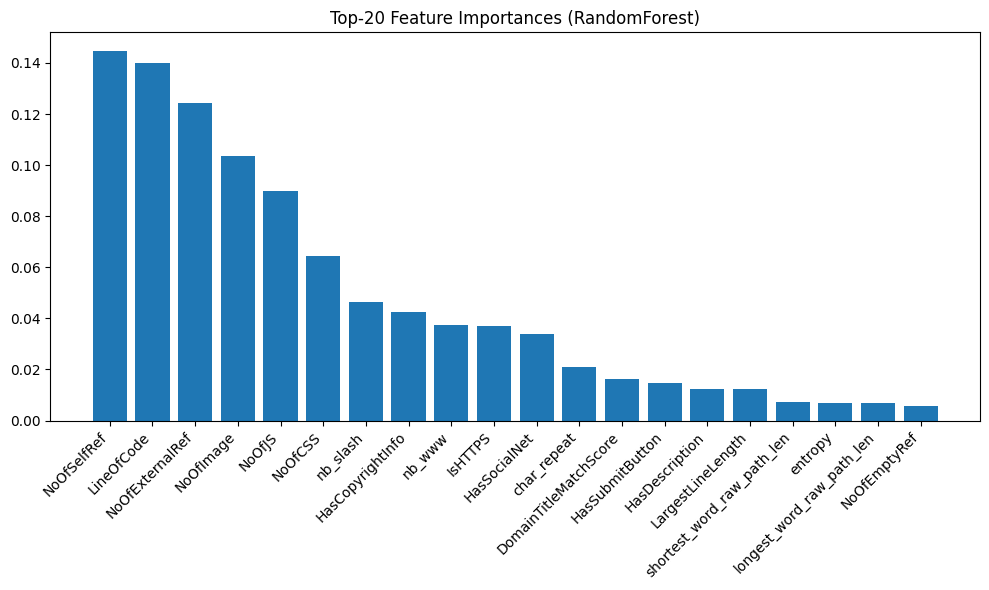

In [ ]:
#fix err code above
feature_names = X_train1.columns  # hoặc df.drop('target', axis=1).columns
feature_importance_RF(RF, feature_names=feature_names, top_n=20)

In [ ]:
import joblib
joblib.dump(RF, 'PhiUSIIL_RF_NUMERICAL.pkl')
!mv /content/PhiUSIIL_RF_NUMERICAL.pkl /content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_RF_NUMERICAL.pkl

# Random Forest Explain Using SHAP(Numerical)

In [ ]:
import joblib
RF = joblib.load('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_RF_NUMERICAL.pkl')
X_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv")
X_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv")
Y_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv")
Y_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv")

In [ ]:
import shap
explainer_rf = shap.TreeExplainer(
    RF,
    X_test1,
    feature_perturbation="interventional",
    model_output="probability"
)

shap_values_rf = explainer_rf.shap_values(X_test1)

100%|===================| 78511/78796 [32:50<00:07]       

In [ ]:
import numpy as np
np.save("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_RF_NUMERICAL_SHAP/shap_values_rf.npy", shap_values_rf)

In [ ]:
shap_values_rf = np.load("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_RF_NUMERICAL_SHAP/shap_values_rf.npy")
feature_names = np.load("/content/drive/MyDrive/DeAnTotNghiep/feature_names.npy", allow_pickle=True)
explainer_rf = shap.TreeExplainer(
    RF,
    X_test1,
    feature_perturbation="interventional",
    model_output="probability"
)

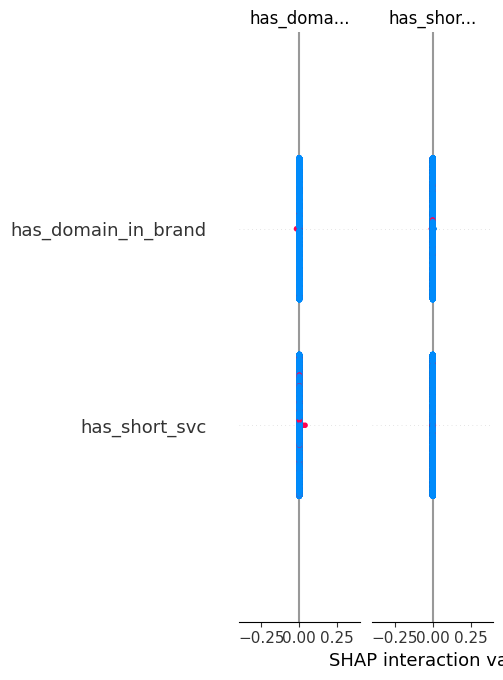

In [ ]:
import shap
shap.summary_plot(shap_values_rf, X_test1)

In [ ]:
print(type(explainer_rf.expected_value))
print(np.array(explainer_rf.expected_value).shape)
print(np.array(shap_values_rf).shape)

<class 'numpy.ndarray'>
(2,)
(39398, 64, 2)


In [ ]:
print(Y_test1.iloc[57])

label    1
Name: 57, dtype: int64


In [ ]:
shap.initjs()
shap.force_plot(explainer_rf.expected_value[1],   # base value cho class 1
                shap_values_rf[57, :, 1],        # SHAP values cho sample 57, class 1
                X_test1.iloc[57])

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values = shap_values_rf[57, :, 1],
        base_values = explainer_rf.expected_value[1],
        data = X_test1.iloc[57],
        feature_names = feature_names
    )
)

In [ ]:
print(Y_test1.iloc[38])

label    0
Name: 38, dtype: int64


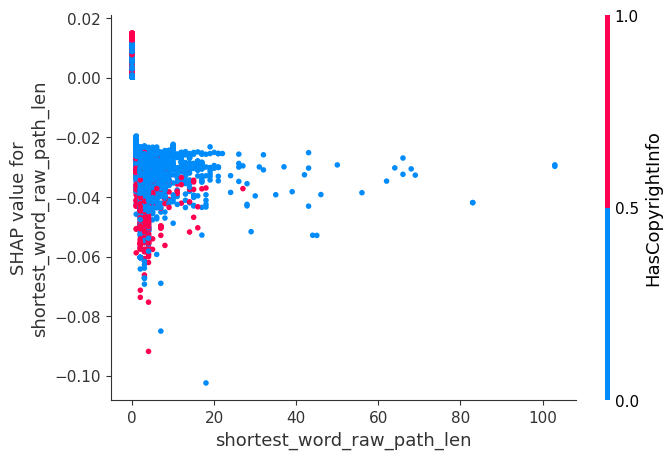

In [ ]:
shap_values_rf_class1 = shap_values_rf[:, :, 1]
shap.dependence_plot("shortest_word_raw_path_len", shap_values_rf_class1, X_test1)

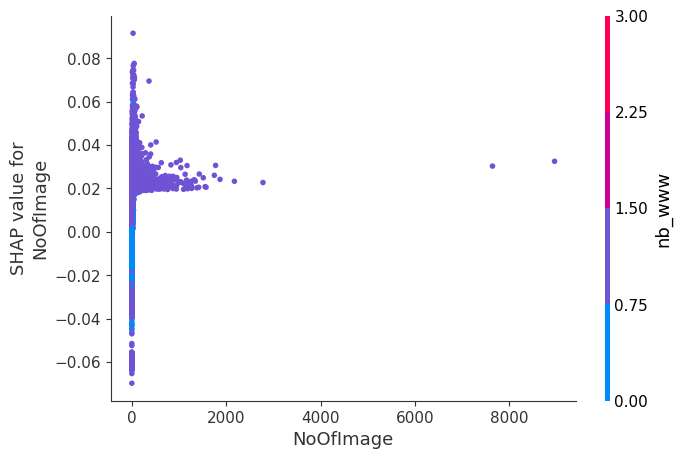

In [ ]:
shap.dependence_plot("NoOfImage", shap_values_rf_class1, X_test1)

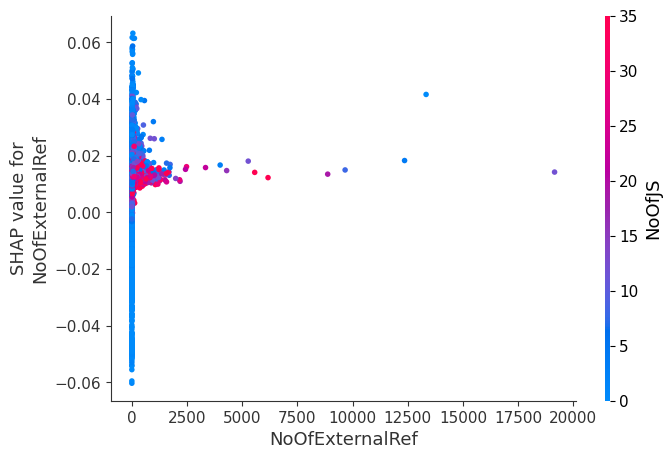

In [ ]:
shap.dependence_plot("NoOfExternalRef", shap_values_rf_class1, X_test1)

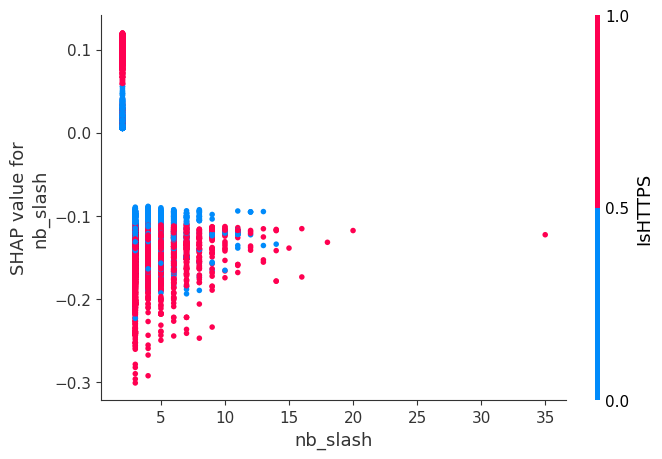

In [ ]:
shap.dependence_plot("nb_slash", shap_values_rf_class1, X_test1)

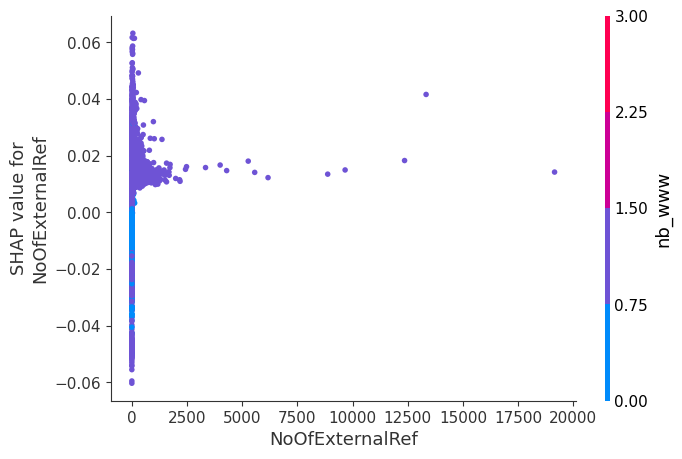

In [ ]:
shap.dependence_plot("NoOfExternalRef", shap_values_rf_class1, X_test1)

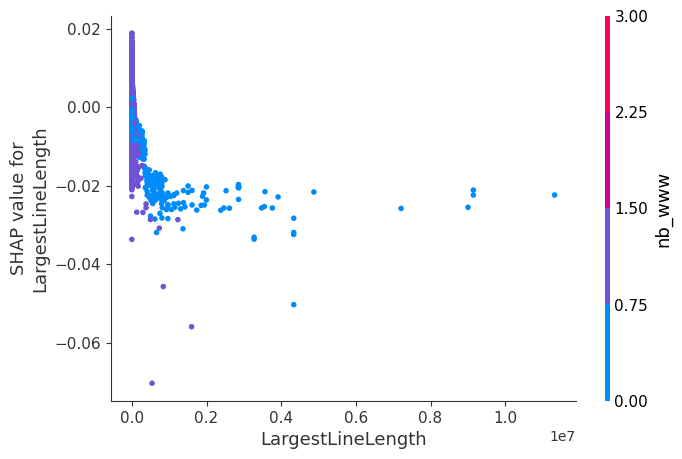

In [ ]:
shap_values_rf_class1 = shap_values_rf[:, :, 1]
shap.dependence_plot("LargestLineLength", shap_values_rf_class1, X_test1)

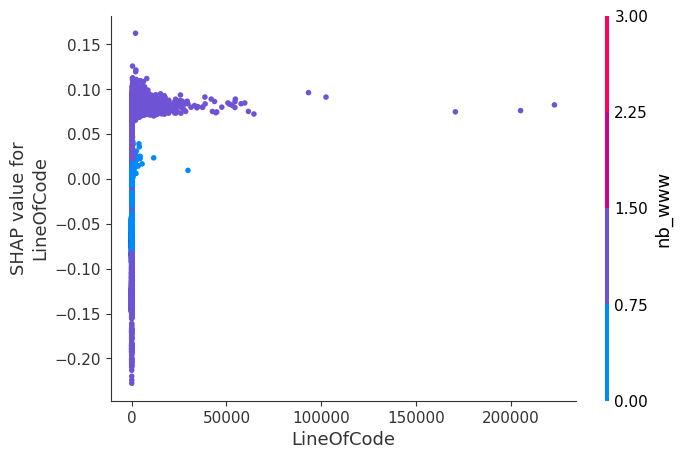

In [ ]:
shap.dependence_plot("LineOfCode", shap_values_rf_class1, X_test1)

In [ ]:
print(Y_test1.iloc[225])

label    0
Name: 225, dtype: int64


In [ ]:
shap.initjs()
shap.force_plot(explainer_rf.expected_value[0],
                shap_values_rf[225, :, 1],
                X_test1.iloc[225])

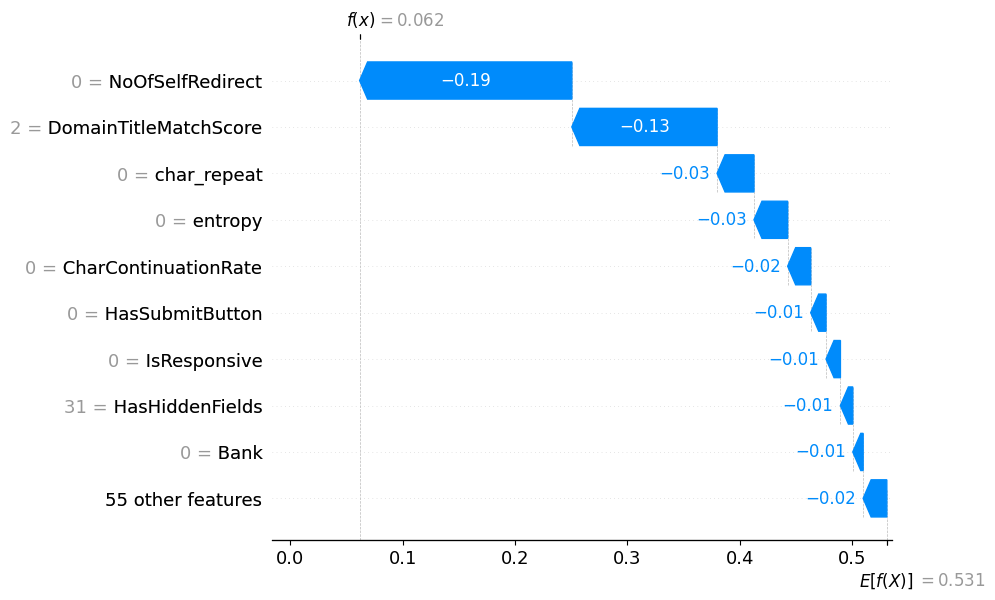

In [ ]:
shap.plots.waterfall(
    shap.Explanation(
        values = shap_values_rf[225, :, 1],
        base_values = explainer_rf.expected_value[0],
        data = X_test1.iloc[225],
        feature_names = feature_names
    )
)

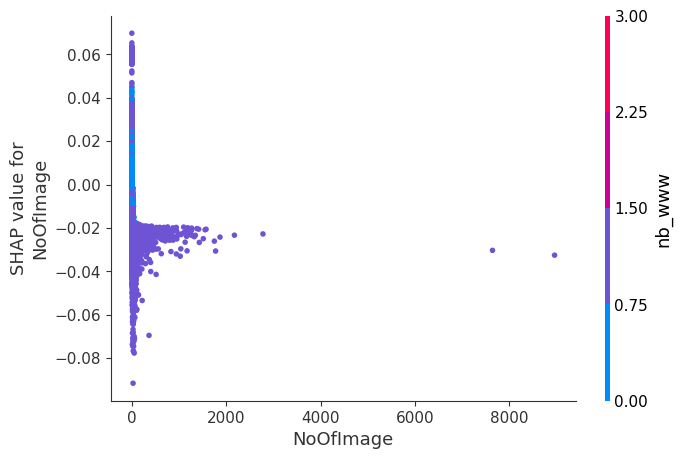

In [ ]:
shap_values_rf_class0 = shap_values_rf[:, :, 0]
shap.dependence_plot("NoOfImage", shap_values_rf_class0, X_test1)

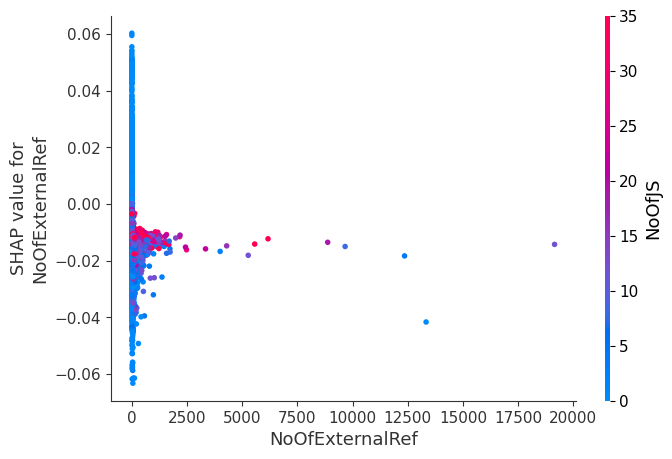

In [ ]:
shap.dependence_plot("NoOfExternalRef", shap_values_rf_class0, X_test1)

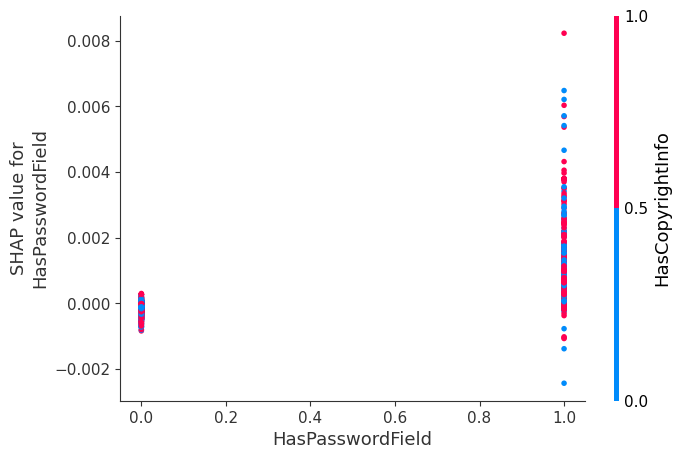

In [ ]:
shap.dependence_plot("HasPasswordField", shap_values_rf_class0, X_test1)

# Training & Evaluating KNN With Numerical-Features

In [ ]:
X_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_train1.csv")
X_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/X_test1.csv")
Y_train1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_train1.csv")
Y_test1 = pd.read_csv("/content/drive/MyDrive/DeAnTotNghiep/Y_test1.csv")

KNN.fit(X_train1, Y_train1)

/usr/local/lib/python3.12/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [ ]:
#import joblib
#KNN = joblib.load('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_KNN_NUMERICAL.pkl')

Accuracy: 0.9984263160566527


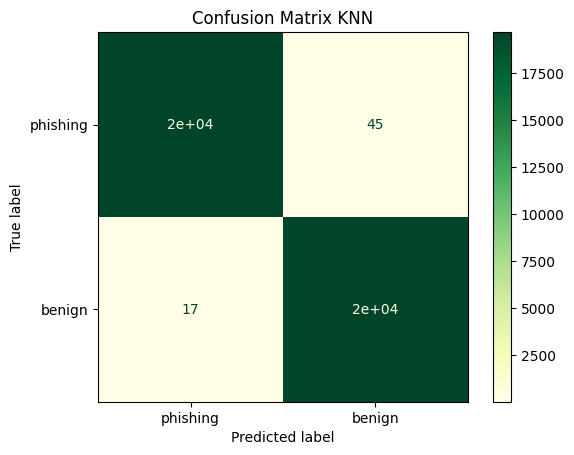

In [ ]:
conf_matrix_KNN_SVM(X_test1, Y_test1, KNN, "KNN", label_names=['phishing', 'benign'])

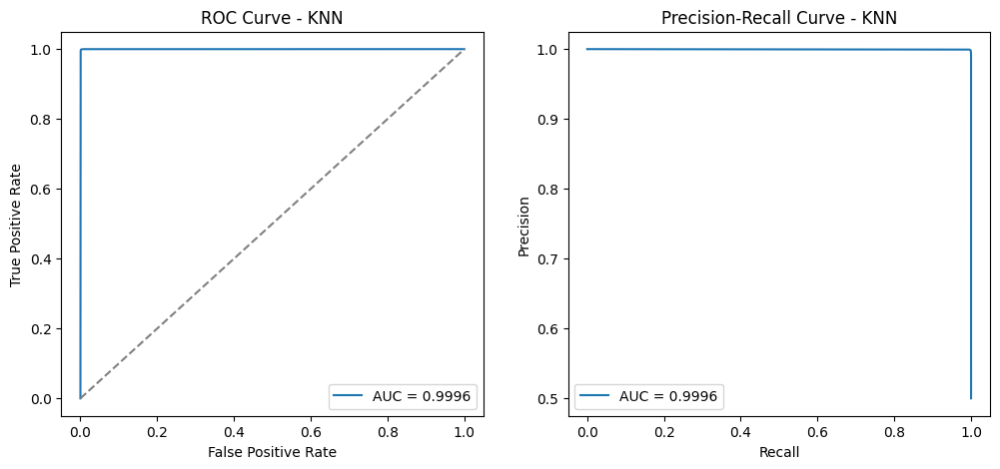

[KNN] ROC-AUC = 0.9996, PR-AUC = 0.9996


In [ ]:
pr_roc_KNN_SVM(X_test1, Y_test1, KNN, "KNN")

In [ ]:
import joblib
joblib.dump(KNN, '/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_KNN_NUMERICAL.pkl')

['/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_KNN_NUMERICAL.pkl']

# KNN Explain Using SHAP (Numerical)

In [ ]:
import joblib
import shap
import numpy as np

knn = joblib.load('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_KNN_NUMERICAL.pkl')
# Lấy scaler và knn ra từ pipeline
scaler = knn.named_steps['scaler']
knn_model = knn.named_steps['knn']

def knn_predict_proba(X):
    # Nếu X rỗng, trả về mảng rỗng đúng shape
    if X.shape[0] == 0:
        return np.zeros((0, len(knn_model.classes_)))

    X_proc = scaler.transform(X)
    return knn_model.predict_proba(X_proc)

explainer_knn = shap.SamplingExplainer(
    knn_predict_proba,
    shap.sample(X_train1, 5000)   # background 50 mẫu
)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [ ]:
# Tính shap values cho 50 mẫu test đầu tiên
shap_values_knn = explainer_knn.shap_values(
    X_test1[:1000],
    nsamples=100   # số mẫu Monte Carlo, giảm xuống (vd: 50) để nhanh hơn
)

  0%|          | 0/1000 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

In [ ]:
print("Any NaN:", np.isnan(shap_values_knn).any())
print("Any Inf:", np.isinf(shap_values_knn).any())
print("Shape:", np.array(shap_values_knn).shape)

Any NaN: True
Any Inf: False
Shape: (1000, 64, 2)


In [ ]:
shap_values_knn_clean = np.nan_to_num(
    shap_values_knn,
    nan=0.0, posinf=0.0, neginf=0.0
)

(1000, 64)


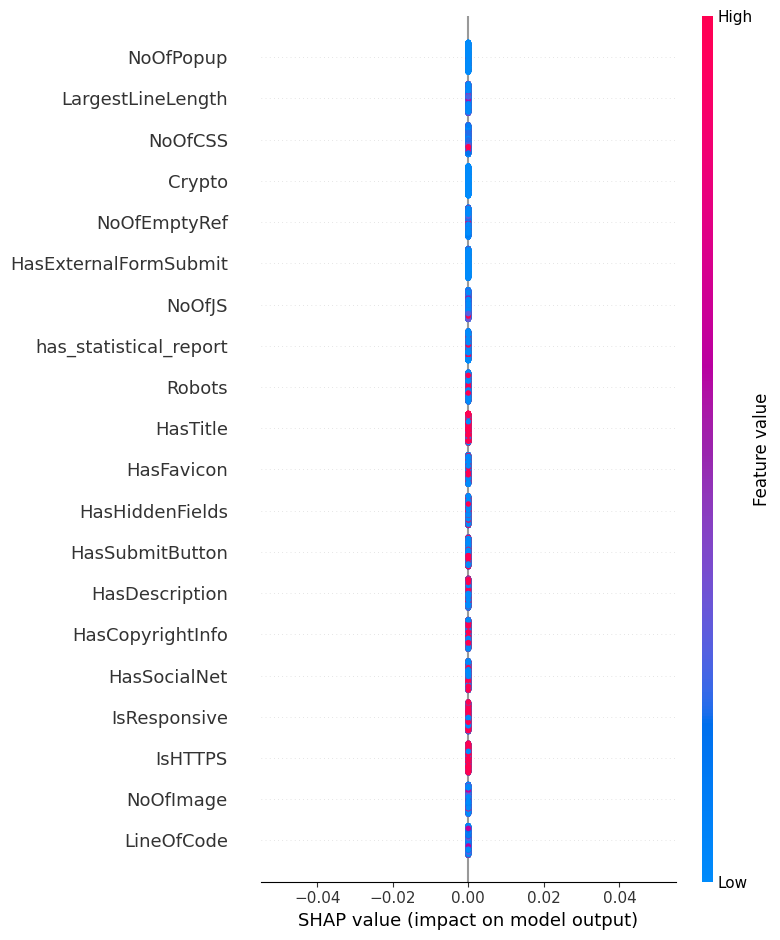

In [ ]:
class_idx = 0
shap_values_class = shap_values_knn_clean[:, :, class_idx]
print(shap_values_class.shape)
shap.summary_plot(
    shap_values_class,
    X_test1[:1000],
    feature_names=X_test1.columns
)

In [ ]:
shap_values_knn_clean = [np.nan_to_num(arr, nan=0.0, posinf=0.0, neginf=0.0)
                         for arr in shap_values_knn]
exp = shap.Explanation(
    values=shap_values_knn_clean[1][27, :],
    base_values=explainer_knn.expected_value[1],
    data=X_test1.iloc[27, :],
    feature_names=X_test1.columns
)

In [ ]:
print("SHAP values shape:", shap_values_knn_clean[1][57, :].shape)
print("Data shape:", X_test1.iloc[57, :].shape)
print("Feature names:", len(X_test1.columns))
type(shap_values_knn)

SHAP values shape: (2,)
Data shape: (64,)
Feature names: 64


numpy.ndarray

In [ ]:
import numpy as np
import shap

sample_idx = 1
class_idx = 1  # positive class

# Nếu shap_values_knn là list
if isinstance(shap_values_knn, list):
    shap_values_row = shap_values_knn[class_idx][sample_idx, :]  # (81,)
else:  # ndarray (n_samples, n_features, n_classes)
    shap_values_row = shap_values_knn[sample_idx, :, class_idx]  # (81,)

print("SHAP row shape:", shap_values_row.shape)
print("Data row shape:", X_test1.iloc[sample_idx, :].shape)

shap.initjs()
shap.force_plot(
    explainer_knn.expected_value[class_idx],
    shap_values_row,
    X_test1.iloc[sample_idx, :],
    feature_names=X_test1.columns
)



SHAP row shape: (64,)
Data row shape: (64,)


# Training & Evaluating SVM With Numerical-Features

In [ ]:
SVM.fit(X_train1, Y_train1)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Pipeline(steps=[('scaler', StandardScaler()), ('svm', SVC(probability=True))])

In [ ]:
#import joblib
#SVM = joblib.load('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_SVM_NUMERICAL.pkl')

Accuracy: 0.9992639220264988


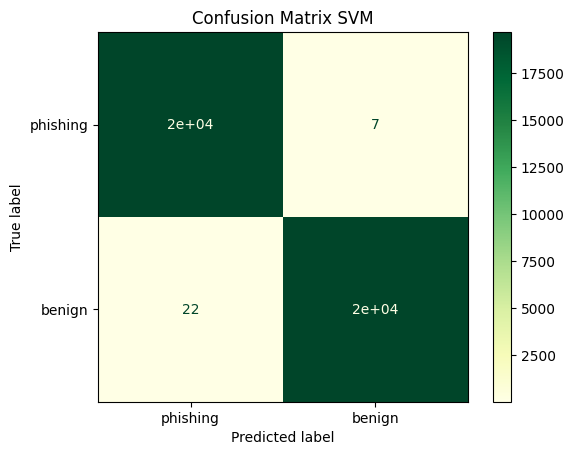

In [ ]:
conf_matrix_KNN_SVM(X_test1, Y_test1, SVM, "SVM", label_names=['phishing', 'benign'])

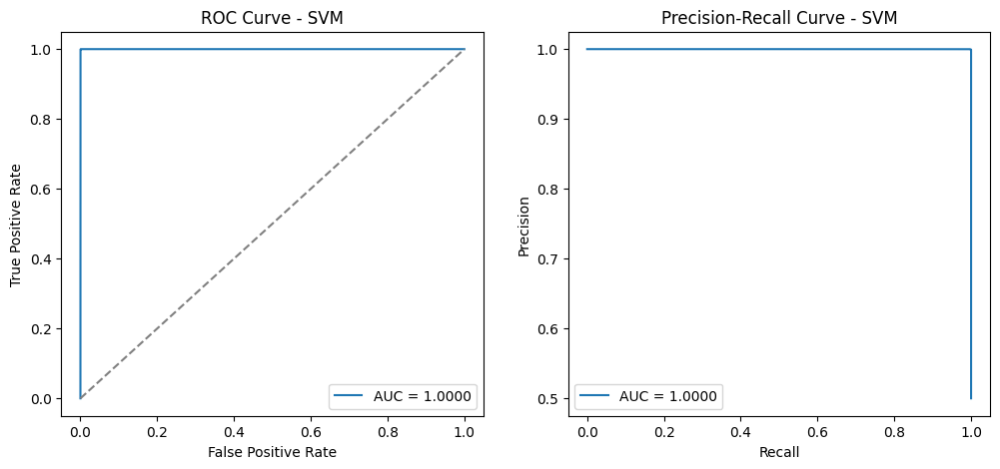

[SVM] ROC-AUC = 1.0000, PR-AUC = 1.0000


In [ ]:
pr_roc_KNN_SVM(X_test1, Y_test1, SVM, "SVM")

In [ ]:
import joblib
joblib.dump(SVM, 'PhiUSIIL_SVM_NUMERICAL.pkl')
!mv /content/PhiUSIIL_SVM_NUMERICAL.pkl /content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_SVM_NUMERICAL.pkl

# SVM Explaination Using LIEM (Numerical)

In [ ]:

import numpy as np, joblib, os

In [ ]:

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3  = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
Y_test3  = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")

In [ ]:
!pip -q install lime

In [ ]:
import os, joblib, numpy as np, tensorflow as tf
from lime.lime_tabular import LimeTabularExplainer

In [ ]:
# Class names
CLASS_NAMES = ['phishing', 'benign']  # 0=phishing, 1=benign

In [ ]:
def ensure_2d(arr3d):
    """(N, F, 1) -> (N, F) for LIME"""
    arr3d = np.asarray(arr3d)
    return np.squeeze(arr3d, axis=-1) if arr3d.ndim == 3 and arr3d.shape[-1] == 1 else arr3d

In [ ]:
def fallback_predict_proba_binary(model, X2d):
    """
    Trả về xác suất 2 lớp [p0, p1] cho binary classifier phi-proba.
    Ưu tiên predict_proba; nếu không có, dùng decision_function -> sigmoid.
    """
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X2d)
        # đảm bảo shape (N,2)
        if proba.shape[1] == 2:
            return proba
        # một số KNN hiếm trả (N,1)
        p1 = proba[:, -1]
        p0 = 1.0 - p1
        return np.stack([p0, p1], axis=1)
    elif hasattr(model, "decision_function"):
        scores = model.decision_function(X2d)
        # (N,) -> sigmoid; (N,2) -> softmax
        if scores.ndim == 1:
            p1 = 1.0 / (1.0 + np.exp(-scores))
            p0 = 1.0 - p1
            return np.stack([p0, p1], axis=1)
        else:
            exps = np.exp(scores - scores.max(axis=1, keepdims=True))
            prob = exps / exps.sum(axis=1, keepdims=True)
            return prob
    else:
        # fallback sang nhị phân theo ngưỡng 0.5 từ predict
        preds = model.predict(X2d).astype(int)
        p1 = preds.astype(float)
        p0 = 1.0 - p1
        return np.stack([p0, p1], axis=1)

In [ ]:
import numpy as np, joblib, os

In [ ]:

X_train_num_2d = ensure_2d(X_train3).astype(np.float32)
X_test_num_2d  = ensure_2d(X_test3).astype(np.float32)

In [ ]:
# Nạp model SVM numerical
MODEL_PATH_SVM_NUM = "/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_SVM_NUMERICAL.pkl"
if os.path.exists(MODEL_PATH_SVM_NUM):
    svm_num = joblib.load(MODEL_PATH_SVM_NUM)
else:
    assert 'svm_num' in globals(), "Không tìm thấy SVM numerical đã train. Lưu model vào joblib hoặc giữ biến 'svm_num' trong session."

In [ ]:
# LIME explainer
expl_svm_num = LimeTabularExplainer(
    training_data=X_train_num_2d,
    feature_names=[f"f{i}" for i in range(X_train_num_2d.shape[1])],
    class_names=CLASS_NAMES,
    discretize_continuous=True,
    mode='classification'
)


In [ ]:
def predict_proba_svm_num(x2d):
    return fallback_predict_proba_binary(svm_num, x2d)

# Giải thích vài mẫu
for i in [0, 1, 2]:
    exp = expl_svm_num.explain_instance(
        X_test_num_2d[i],
        predict_proba_svm_num,
        num_features=15,
        top_labels=2
    )
    print(f"[SVM-NUM] Sample {i} -> top contributions for label=1 (benign):")
    print(exp.as_list(label=1))

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[SVM-NUM] Sample 0 -> top contributions for label=1 (benign):
[('f13 <= 0.00', 0.5871630803491704), ('f2 <= 0.00', 0.5766891271196152), ('f9 <= 0.00', 0.5262924609363013), ('0.00 < f46 <= 1.00', 0.4199750813791691), ('f11 <= 0.00', 0.2957018053280636), ('2.00 < f30 <= 3.00', -0.28497803066247085), ('f10 <= 0.00', 0.2823812723385205), ('f12 <= 0.00', 0.22748817439350233), ('f22 <= 0.00', 0.20576096267792582), ('f6 <= 0.00', 0.20325871294022374), ('f14 <= 0.00', 0.1939054156209981), ('f31 <= 0.00', -0.18503075820435733), ('f29 <= 0.00', 0.12750443049488738), ('f23 <= 0.00', 0.12029211543355209), ('f5 <= 0.00', 0.1192136954457442)]


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[SVM-NUM] Sample 1 -> top contributions for label=1 (benign):
[('f13 <= 0.00', 0.6098714644781565), ('f30 <= 2.00', 0.44069590220499194), ('f2 <= 0.00', 0.43247638086471324), ('f9 <= 0.00', 0.42411071507083414), ('0.00 < f46 <= 1.00', 0.4086427565509978), ('f11 <= 0.00', 0.33889070845701125), ('f10 <= 0.00', 0.25915154813899866), ('f6 <= 0.00', 0.2419603998382159), ('f12 <= 0.00', 0.23697366278091322), ('0.00 < f31 <= 1.00', 0.18210081492100078), ('f22 <= 0.00', 0.16470038312667923), ('f14 <= 0.00', 0.1508374555870869), ('f23 <= 0.00', 0.13512279612927183), ('f29 <= 0.00', 0.12433954944607367), ('f5 <= 0.00', 0.10478922060495817)]


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[SVM-NUM] Sample 2 -> top contributions for label=1 (benign):
[('f13 <= 0.00', 0.606458774801618), ('f9 <= 0.00', 0.4601037248216875), ('f30 <= 2.00', 0.45440813086291054), ('f46 <= 0.00', -0.41262854415261296), ('f2 <= 0.00', 0.3680473590881753), ('f11 <= 0.00', 0.29367317358460265), ('f12 <= 0.00', 0.2486304072915737), ('f14 <= 0.00', 0.23564909825203229), ('f6 <= 0.00', 0.21705045803951004), ('f10 <= 0.00', 0.20731696022393625), ('0.00 < f31 <= 1.00', 0.2044751961543245), ('f22 <= 0.00', 0.1861371920534387), ('f5 <= 0.00', 0.13352666453395215), ('f23 <= 0.00', 0.11530674515270001), ('f1 <= 0.00', 0.08260897029346705)]


In [ ]:
# ==== VẼ BIỂU ĐỒ LIME THEO TỪNG MẪU (SVM – Numerical 81-d) ====
import os
import numpy as np
import matplotlib.pyplot as plt

# Thư mục lưu ảnh
OUT_DIR = "/content/drive/MyDrive/DeAnTotNghiep/LIME_Plots_SVM_NUM"
os.makedirs(OUT_DIR, exist_ok=True)


In [ ]:
def lime_barplot(exp, label=1, title="SVM-NUM – LIME per-sample", savepath=None):
    """
    Vẽ biểu đồ thanh từ exp.as_list(label=...).
    - label=1 (benign) theo mapping 0=phish,1=benign của bạn.
    """
    pairs = exp.as_list(label=label)  # [(rule, weight), ...]
    if not pairs:
        print("[WARN] Không có rule để vẽ.")
        return

    # Sắp xếp theo |weight| giảm dần
    rules, weights = zip(*pairs)
    order = np.argsort(np.abs(weights))[::-1]
    rules  = [rules[i] for i in order]
    weights = [weights[i] for i in order]

    # Vẽ 1 chart/figure
    plt.figure(figsize=(8, 5))
    y = list(range(len(rules)))[::-1]
    w = list(weights)[::-1]
    r = list(rules)[::-1]
    plt.barh(y, w)
    plt.yticks(y, r)
    plt.xlabel("LIME contribution (±)")
    plt.title(title)
    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=150)
        plt.close()
        print("[Saved]", savepath)
    else:
        plt.show()

# === Vẽ cho vài mẫu ví dụ (0,1,2) ===
sample_ids = [0, 1, 2]
for i in sample_ids:
    exp = expl_svm_num.explain_instance(
        X_test_num_2d[i],
        predict_proba_svm_num,
        num_features=15,
        top_labels=2
    )
    png_path = os.path.join(OUT_DIR, f"LIME_SVM_NUM_sample_{i}.png")
    lime_barplot(
        exp, label=1,
        title=f"SVM-NUM – Sample {i} (label=1 benign)",
        savepath=png_path
    )

print("Xong! Ảnh lưu tại:", OUT_DIR)


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[Saved] /content/drive/MyDrive/DeAnTotNghiep/LIME_Plots_SVM_NUM/LIME_SVM_NUM_sample_0.png


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[Saved] /content/drive/MyDrive/DeAnTotNghiep/LIME_Plots_SVM_NUM/LIME_SVM_NUM_sample_1.png


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


[Saved] /content/drive/MyDrive/DeAnTotNghiep/LIME_Plots_SVM_NUM/LIME_SVM_NUM_sample_2.png
Xong! Ảnh lưu tại: /content/drive/MyDrive/DeAnTotNghiep/LIME_Plots_SVM_NUM


# Prepare Train/Test For BiLSTM/CNN/CNN-LSTM (Numerical)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
columns_to_scale = [col for col in X1.columns]
scaler = MinMaxScaler(feature_range=(0, 1))
X1[columns_to_scale] = scaler.fit_transform(X1[columns_to_scale])
X1.head(10)

,has_short_svc,has_domain_in_brand,nb_at,nb_hyphens,word_raw_len,nb_equal,nb_underscore,has_ip,ratio_digits_host,has_abnormal_subdomain,...,HasTitle,Robots,has_statistical_report,NoOfJS,HasExternalFormSubmit,NoOfEmptyRef,Crypto,NoOfCSS,LargestLineLength,NoOfPopup
0,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.004025,0.0,0.000000,0.0,0.000558,0.000670,0.000000
1,0.0,0.0,0.0,0.0,0.00266,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.001006,0.0,0.000409,0.0,0.000056,0.000047,0.000000
2,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.002156,0.0,0.000205,1.0,0.000754,0.001918,0.001661
3,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.001581,0.0,0.000000,0.0,0.000028,0.000051,0.001661
4,1.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.002012,0.0,0.000409,0.0,0.000112,0.000069,0.003322
5,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.003162,0.0,0.000000,0.0,0.000056,0.000027,0.000000
6,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.001725,0.0,0.001228,0.0,0.000028,0.000033,0.000000
7,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.001437,0.0,0.000205,0.0,0.000363,0.000040,0.000000
8,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000005,0.000000
9,0.0,0.0,0.0,0.0,0.00133,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.001869,0.0,0.000205,0.0,0.000251,0.000073,0.019934


In [ ]:
from sklearn.model_selection import train_test_split
X_train3,X_test3,Y_train3,Y_test3 = train_test_split(X1,Y1,stratify = Y1,test_size = 0.2,random_state = 42)

In [ ]:
X_test3 = np.nan_to_num(X_test3, nan=0.0)
Y_test3 = np.nan_to_num(Y_test3, nan=0.0)
X_train3 = np.nan_to_num(X_train3, nan=0.0)
Y_train3 = np.nan_to_num(Y_train3, nan=0.0)

In [ ]:
X_train3 = np.expand_dims(X_train3, axis=-1)
X_test3 = np.expand_dims(X_test3, axis=-1)
print(X_train3.shape, Y_train3.shape)
print(type(X_train3))

(157592, 64, 1) (157592,)
<class 'numpy.ndarray'>


In [ ]:
np.save("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy", X_train3)
np.save("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy", X_test3)
np.save("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy", Y_train3)
np.save("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy", Y_test3)

# Training & Evaluation BiLSTM With Numerical-Features

In [ ]:
import tensorflow as tf
BiLSTM_model1.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(curve='PR', name="pr_auc")
    ]
)

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        'PhiUSIIL_BiLSTM_Numerical.keras',
        verbose=1,
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=15,
        verbose=1
    )
]

BiLSTM_results_1 = BiLSTM_model1.fit(
    X_train3, Y_train3,
    validation_split=0.2,
    batch_size=128,
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200
982/985 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9145 - loss: 0.1975 - pr_auc: 0.9715 - precision: 0.8880 - recall: 0.9607
Epoch 1: val_loss improved from inf to 0.05802, saving model to PhiUSIIL_BiLSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - accuracy: 0.9146 - loss: 0.1972 - pr_auc: 0.9716 - precision: 0.8882 - recall: 0.9607 - val_accuracy: 0.9813 - val_loss: 0.0580 - val_pr_auc: 0.9969 - val_precision: 0.9683 - val_recall: 0.9952
Epoch 2/200
985/985 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9829 - loss: 0.0487 - pr_auc: 0.9976 - precision: 0.9804 - recall: 0.9855
Epoch 2: val_loss improved from 0.05802 to 0.02934, saving model to PhiUSIIL_BiLSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 19s 19ms/step - accuracy: 0.9829 - loss: 0.0487 - pr_auc: 0.9976 - precision: 0.9804 - recall: 0.9855 - val_accuracy: 0.9889 - val_loss: 0.0293 - val_pr_auc: 0.9992 - val_precision: 0.9851 - val_recall: 0.9928
Epoch 3/200
983/985 ━━━━━━━━━━━━━━━━━━━━ 0

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
BiLSTM_results_1 = tf.keras.models.load_model(
    "/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_BiLSTM_Numerical.keras"
)

test_loss, test_acc, test_prec, test_rec, test_pr_auc = BiLSTM_results_1.evaluate(X_test3, Y_test3)
print(f"Loss: {test_loss:.4f}")
print(f"Accuracy: {test_acc:.4f}")
print(f"Precision: {test_prec:.4f}")
print(f"Recall: {test_rec:.4f}")
print(f"PR AUC: {test_pr_auc:.4f}")


1232/1232 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.9994 - loss: 0.0029 - pr_auc: 0.9999 - precision: 0.9992 - recall: 0.9996
Loss: 0.0024
Accuracy: 0.9994
Precision: 0.9992
Recall: 0.9996
PR AUC: 0.9999


In [ ]:
eval_graph_CNN(BiLSTM_results_1)

AttributeError: 'Sequential' object has no attribute 'history'

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step


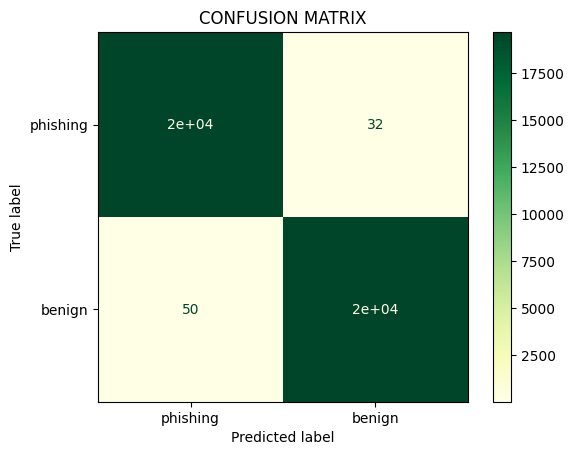

F1-Score: 0.9979


In [ ]:
conf_matrix_CNN(X_test3, Y_test3, BiLSTM_model1 , label_names=['phishing', 'benign'])

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step


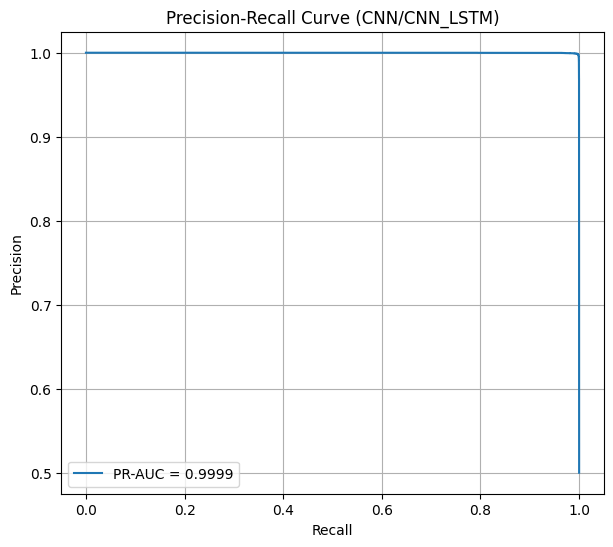

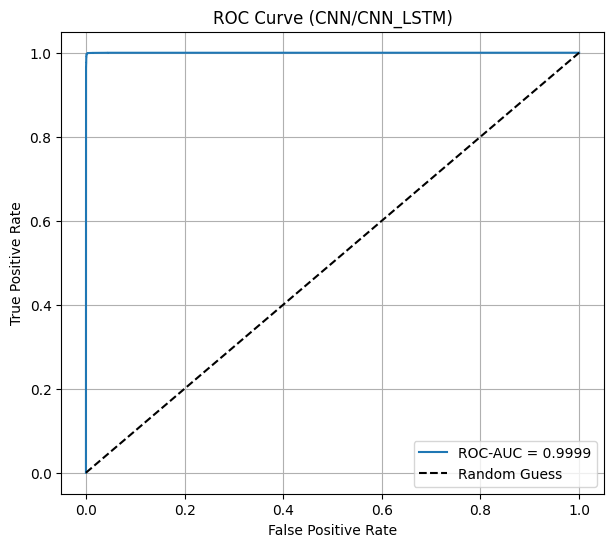

PR-AUC : 0.9999
ROC-AUC: 0.9999


(np.float64(0.9999267012119147), np.float64(0.9999300748409357))

In [ ]:
pr_roc_CNN(X_test3, Y_test3,BiLSTM_model1 )

In [ ]:
!mv /content/PhiUSIIL_BiLSTM_Numerical.keras /content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_BiLSTM_Numerical.keras

# BiLSTM Explain Using LIME (Numerical)

In [ ]:
from lime import lime_tabular
import tensorflow as tf
import numpy as np

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
feature_names = np.load("/content/drive/MyDrive/DeAnTotNghiep/feature_names.npy", allow_pickle=True).tolist()
BiLSTM_results_1 = tf.keras.models.load_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_BiLSTM_Numerical.keras", compile=False)

In [ ]:
# Flatten input từ (81, 1) -> (81,)
X_train_flat = X_train3.reshape(X_train3.shape[0], -1)
X_test_flat = X_test3.reshape(X_test3.shape[0], -1)

In [ ]:
def predict_proba(x):
    x_reshaped = x.reshape(x.shape[0], 64, 1)
    p_benign = BiLSTM_results_1.predict(x_reshaped, verbose=0)
    p_phish = 1 - p_benign
    return np.concatenate([p_phish, p_benign], axis=1)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    X_train_flat,
    feature_names=feature_names,
    class_names=['Phishing', 'Benign'],
    mode='classification'
)

In [ ]:
exp = explainer.explain_instance(
    X_test_flat[57],
    predict_proba,
    num_features=20,
    num_samples=5000
)
exp.show_in_notebook(show_table=True)

In [ ]:
Y_test3[57]

np.int64(1)

In [ ]:
exp.save_to_file('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_BiLSTM_NUMERICAL_LIME/sample_57_explaination.html')

In [ ]:
exp = explainer.explain_instance(
    X_test_flat[11],
    predict_proba,
    num_features=20,
    num_samples=5000
)
exp.show_in_notebook(show_table=True)

In [ ]:
Y_test3[11]

np.int64(0)

In [ ]:
exp.save_to_file('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_BiLSTM_NUMERICAL_LIME/sample_11_explaination.html')

# Training & Evaluation CNN With Numerical-Features

In [ ]:
import tensorflow as tf
CNN_LSTM_model1.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(curve='PR', name="pr_auc")
    ]
)

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        'PhiUSIIL_CNN_LSTM_Numerical.keras',
        verbose=1,
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=15,
        verbose=1
    )
]

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
Y_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")

CNN_LSTM_results_1 = CNN_LSTM_model1.fit(
    X_train3, Y_train3,
    validation_split=0.2,
    batch_size=128,
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200
985/985 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9731 - loss: 0.0699 - pr_auc: 0.9921 - precision: 0.9724 - recall: 0.9723
Epoch 1: val_loss improved from inf to 0.00720, saving model to PhiUSIIL_CNN_LSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 21s 16ms/step - accuracy: 0.9732 - loss: 0.0699 - pr_auc: 0.9921 - precision: 0.9724 - recall: 0.9723 - val_accuracy: 0.9983 - val_loss: 0.0072 - val_pr_auc: 0.9990 - val_precision: 0.9972 - val_recall: 0.9993
Epoch 2/200
985/985 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9977 - loss: 0.0080 - pr_auc: 0.9995 - precision: 0.9971 - recall: 0.9984
Epoch 2: val_loss improved from 0.00720 to 0.00549, saving model to PhiUSIIL_CNN_LSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 14s 15ms/step - accuracy: 0.9977 - loss: 0.0080 - pr_auc: 0.9995 - precision: 0.9971 - recall: 0.9984 - val_accuracy: 0.9982 - val_loss: 0.0055 - val_pr_auc: 0.9997 - val_precision: 0.9987 - val_recall: 0.9976
Epoch 3/200
983/985 ━━━━━━━━━━━━━━━━━━

In [ ]:
CNN_results_1 = tf.keras.models.load_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_Numerical.keras")

ValueError: File not found: filepath=/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_Numerical.keras. Please ensure the file is an accessible `.keras` zip file.

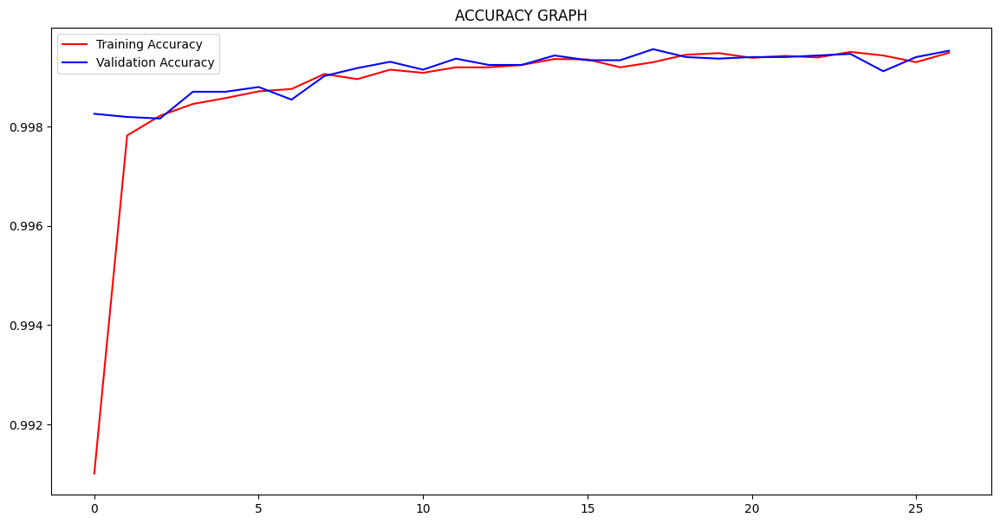

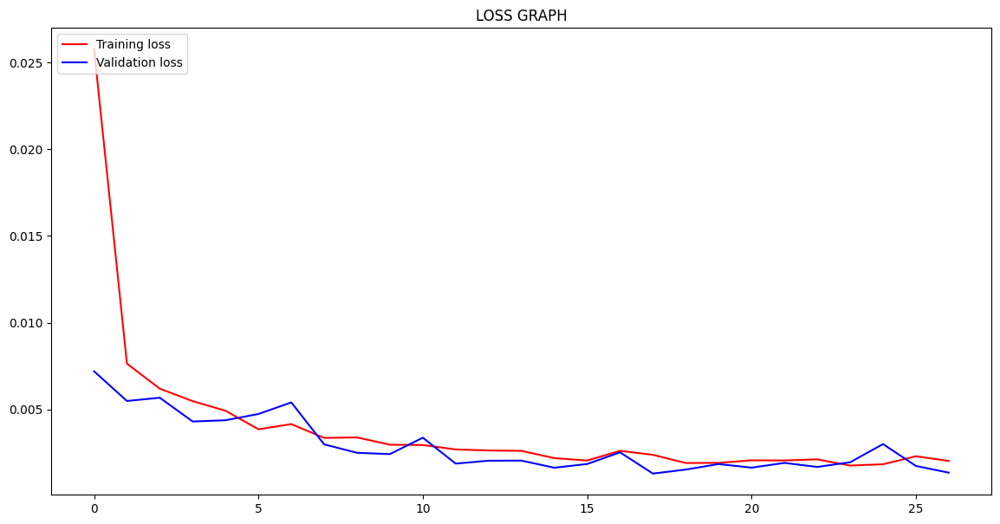

In [ ]:
eval_graph_CNN(CNN_LSTM_results_1)

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


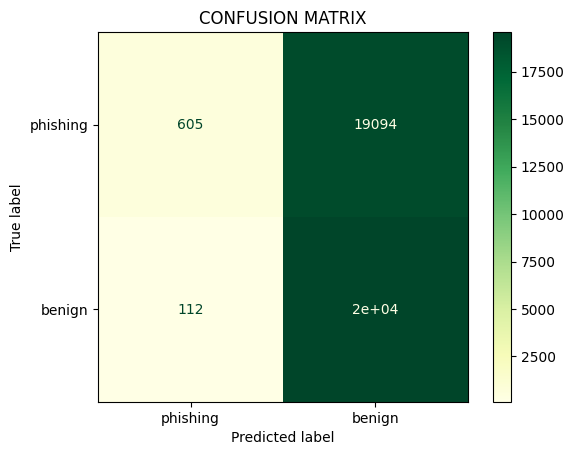

F1-Score: 0.6710


In [ ]:
conf_matrix_CNN(X_test3, Y_test3, CNN_model1, label_names=['phishing', 'benign'])

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step


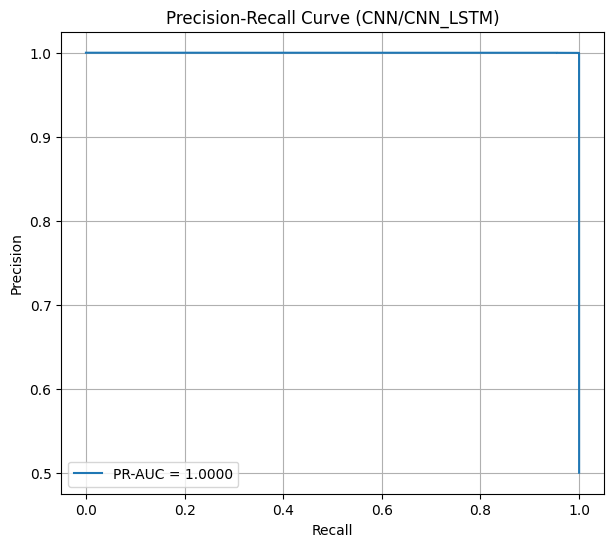

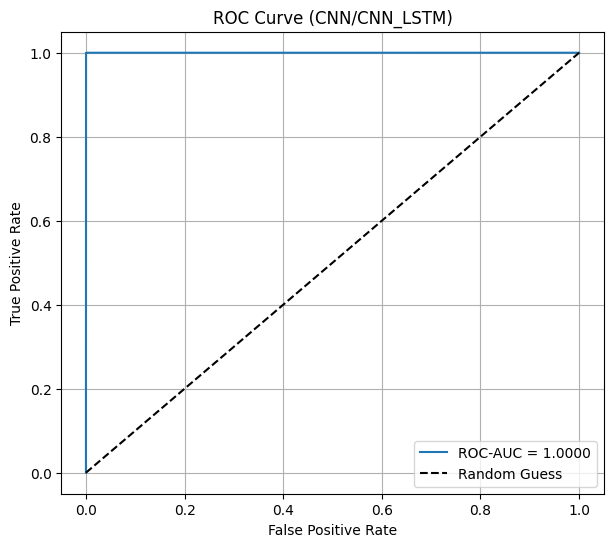

PR-AUC : 1.0000
ROC-AUC: 1.0000


(0.9999884838630224, 0.9999892320744015)

In [ ]:
pr_roc_CNN(X_test3, Y_test3, CNN_model1)

In [ ]:
!mv /content/PhiUSIIL_CNN_Numerical.keras /content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_Numerical.keras

# CNN Explain Using SHAP (Numerical)

In [ ]:
import shap
import tensorflow as tf
import numpy as np

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
Y_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")
CNN_model1 = tf.keras.models.load_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_Numerical.keras")

In [ ]:
# Tạo background set cân bằng (5000 benign + 5000 phish)
benign_indices_train = np.where(Y_train3 == 1)[0]
phish_indices_train = np.where(Y_train3 == 0)[0]

# Lấy ngẫu nhiên 5000 mẫu từ mỗi class
np.random.seed(42)  # Để có thể tái tạo kết quả
benign_sample_train = np.random.choice(benign_indices_train, size=5000, replace=False)
phish_sample_train = np.random.choice(phish_indices_train, size=5000, replace=False)

# Kết hợp và tạo background
background_indices = np.concatenate([benign_sample_train, phish_sample_train])
np.random.shuffle(background_indices)  # Trộn ngẫu nhiên
background = X_train3[background_indices]

print(f"Background shape: {background.shape}")
print(f"Background labels distribution: Benign={np.sum(Y_train3[background_indices] == 1)}, Phish={np.sum(Y_train3[background_indices] == 0)}")

Background shape: (10000, 81, 1)
Background labels distribution: Benign=5000, Phish=5000


In [ ]:
# Tạo test set cân bằng (2500 benign + 2500 phish)
benign_indices_test = np.where(Y_test3 == 1)[0]
phish_indices_test = np.where(Y_test3 == 0)[0]

benign_sample_test = np.random.choice(benign_indices_test, size=2500, replace=False)
phish_sample_test = np.random.choice(phish_indices_test, size=2500, replace=False)

# Kết hợp và tạo test set
test_indices = np.concatenate([benign_sample_test, phish_sample_test])
np.random.shuffle(test_indices)  # Trộn ngẫu nhiên
X_test_balanced = X_test3[test_indices]
Y_test_balanced = Y_test3[test_indices]

print(f"Test set shape: {X_test_balanced.shape}")
print(f"Test labels distribution: Benign={np.sum(Y_test_balanced == 1)}, Phish={np.sum(Y_test_balanced == 0)}")

Test set shape: (5000, 81, 1)
Test labels distribution: Benign=2500, Phish=2500


In [ ]:
explainer = shap.DeepExplainer(CNN_model1, background)
shap_values = explainer.shap_values(X_test_balanced)

print("Output classes:", len(shap_values))
print("Shape SHAP values:", shap_values[0].shape)

/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/shap/explainers/_deep/deep_tf.py:153: UserWarning: You have provided over 5k background samples! For better performance consider using smaller random sample.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_2
Received: inputs=['Tensor(shape=(10000, 81, 1))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_2
Received: inputs=['Tensor(shape=(20000, 81, 1))']
  warnings.warn(msg)
/usr/local/l

Output classes: 5000
Shape SHAP values: (81, 1, 1)


In [ ]:
if isinstance(shap_values, list):
    shap_values = shap_values[0]

print("Raw shap_values shape:", np.array(shap_values).shape)


Raw shap_values shape: (5000, 81, 1, 1)


In [ ]:
np.save("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_NUMERICAL_SHAP/shap_values.npy", shap_values)
np.save("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_NUMERICAL_SHAP/X_test2d.npy", X_test2d)

In [ ]:
shap_values = np.load("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_NUMERICAL_SHAP/shap_values.npy", allow_pickle=True)
X_test2d = np.load("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_NUMERICAL_SHAP/X_test2d.npy")
feature_names = np.load("/content/drive/MyDrive/DeAnTotNghiep/feature_names.npy", allow_pickle=True).tolist()

In [ ]:
shap_values_2d = shap_values.reshape(shap_values.shape[0], shap_values.shape[1])
#X_test2d = X_test3[:5000].reshape(5000, 81) #Bỏ comment trong trường hợp chạy lỗi
explainer = shap.DeepExplainer(CNN_model1, background)

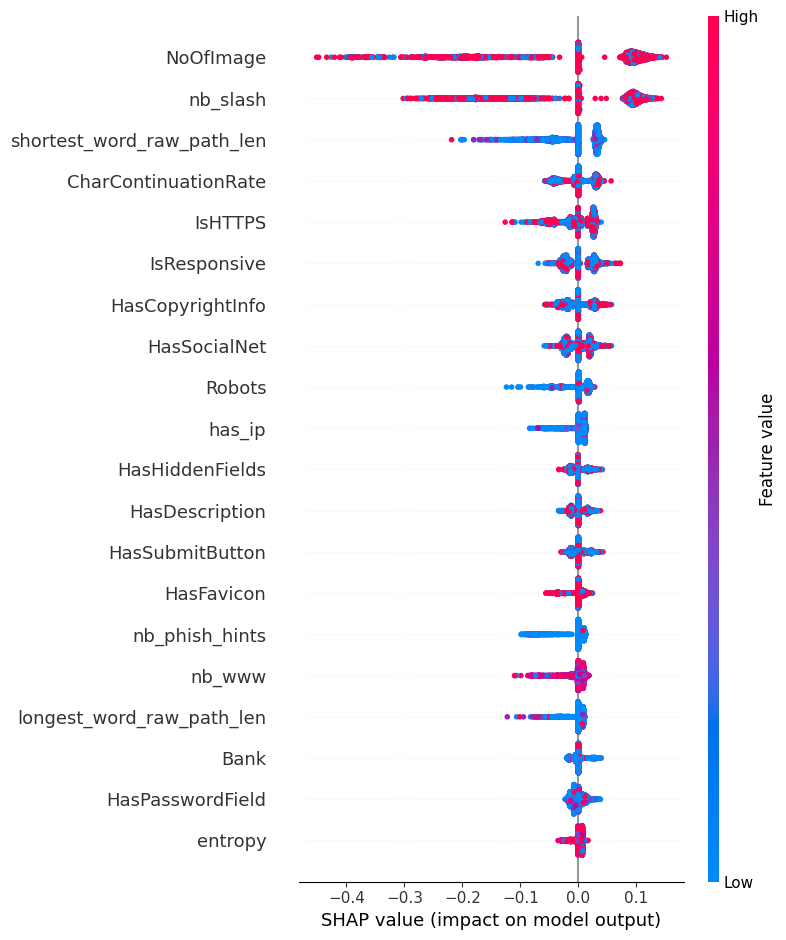

In [ ]:
shap.summary_plot(
    shap_values_2d,
    X_test2d,
    feature_names=feature_names,
    max_display=20
)

In [ ]:
sample_idx = 78
prediction = CNN_model1.predict(X_test_balanced[sample_idx:sample_idx+1], verbose=0)
print(f"Model prediction for sample {sample_idx}: {prediction}")
print(f"True label: {'Benign (1)' if Y_test_balanced[sample_idx] == 1 else 'Phish (0)'}")

# Kiểm tra phân bố giá trị trong data
print(f"\nX_test_flat[{sample_idx}] statistics:")
print(f"Min: {X_test_flat[sample_idx].min()}")
print(f"Max: {X_test_flat[sample_idx].max()}")
print(f"Mean: {X_test_flat[sample_idx].mean()}")
print(f"Unique values: {np.unique(X_test_flat[sample_idx])[:10]}")  # 10 giá trị đầu

# Kiểm tra SHAP values
print(f"\nSHAP values for sample {sample_idx}:")
print(f"Min: {shap_values_reshaped[sample_idx].min()}")
print(f"Max: {shap_values_reshaped[sample_idx].max()}")
print(f"Mean: {shap_values_reshaped[sample_idx].mean()}")
print(f"Sum: {shap_values_reshaped[sample_idx].sum()}")

Model prediction for sample 78: [[1.3629136e-28]]
True label: Phish (0)

X_test_flat[78] statistics:
Min: 0.0
Max: 1.0
Mean: 0.0756143759415525
Unique values: [0.00000000e+00 4.93713736e-06 1.58133483e-05 6.32234674e-04
 2.65957447e-03 4.18410042e-03 1.51515152e-02 2.04081633e-02
 6.10287707e-02 1.11764706e-01]

SHAP values for sample 78:
Min: -0.10661535662061779
Max: 0.0014762115770037808
Mean: -0.006170120295109594
Sum: -0.49977974390387714


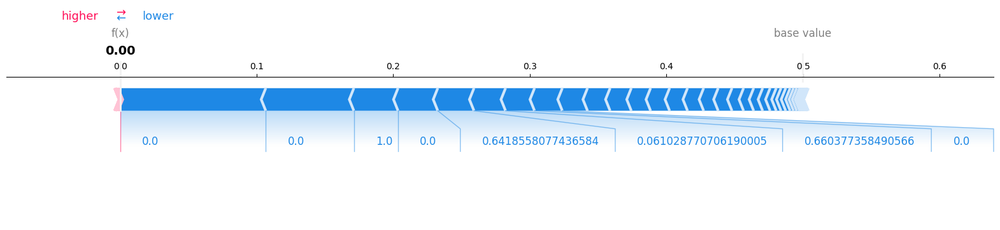

In [ ]:
shap.force_plot(
    base_value,
    shap_values_reshaped[sample_idx],
    X_test_flat[sample_idx],
    matplotlib=True
)

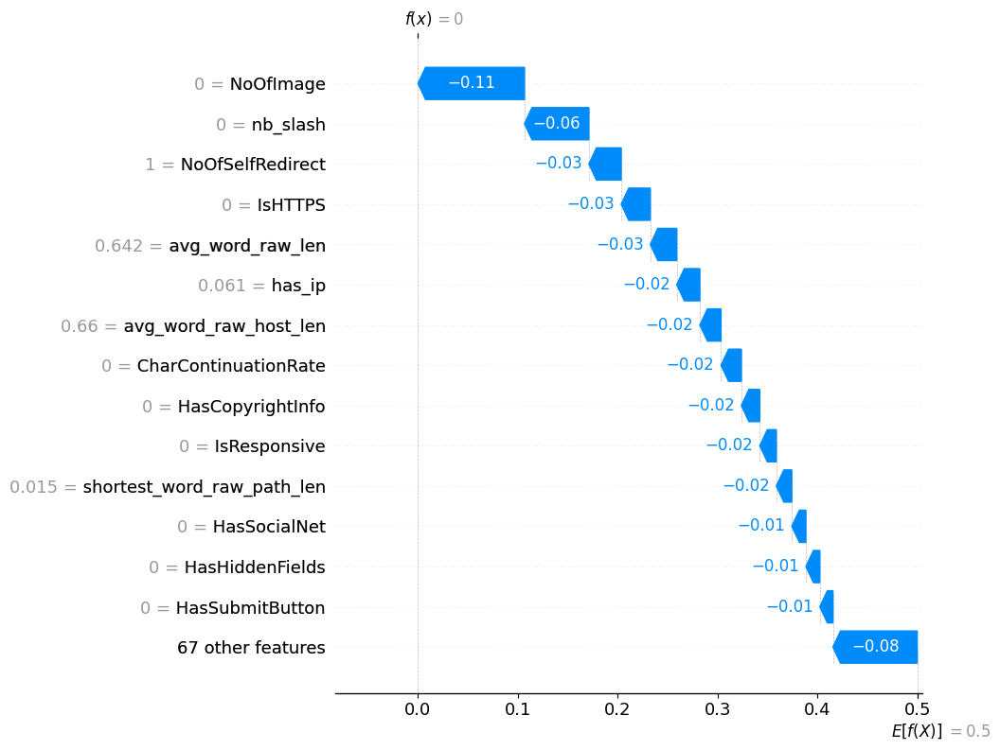

In [ ]:
explanation = shap.Explanation(
    values=shap_values_reshaped[sample_idx],
    base_values=base_value,
    data=X_test_flat[sample_idx],
    feature_names=real_feature_names
)

shap.plots.waterfall(explanation, max_display=15)

In [ ]:
abs_shap_sample = np.abs(shap_values_reshaped[sample_idx])
top_features = np.argsort(abs_shap_sample)[-6:][::-1]

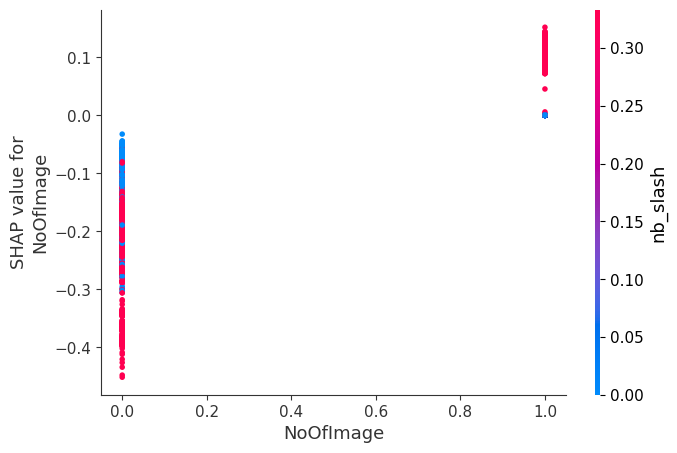

In [ ]:
shap.dependence_plot(
    top_features[0],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

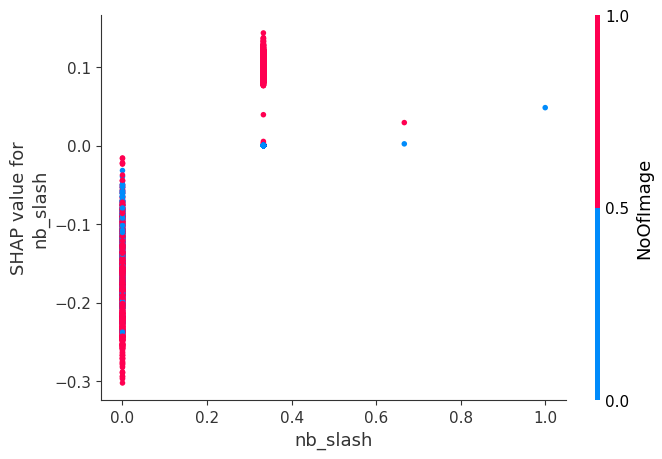

In [ ]:
shap.dependence_plot(
    top_features[1],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

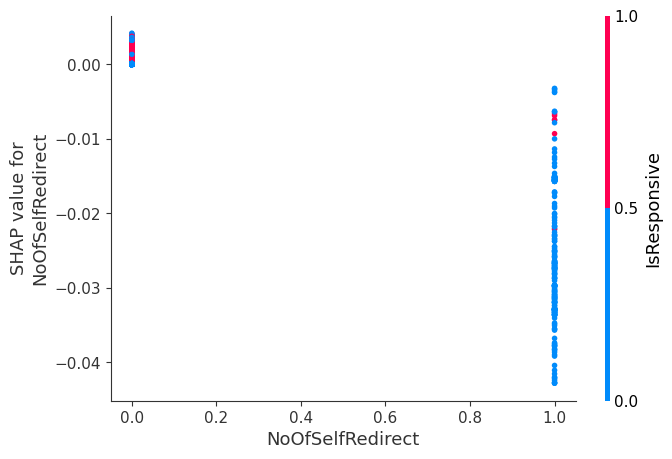

In [ ]:
shap.dependence_plot(
    top_features[2],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

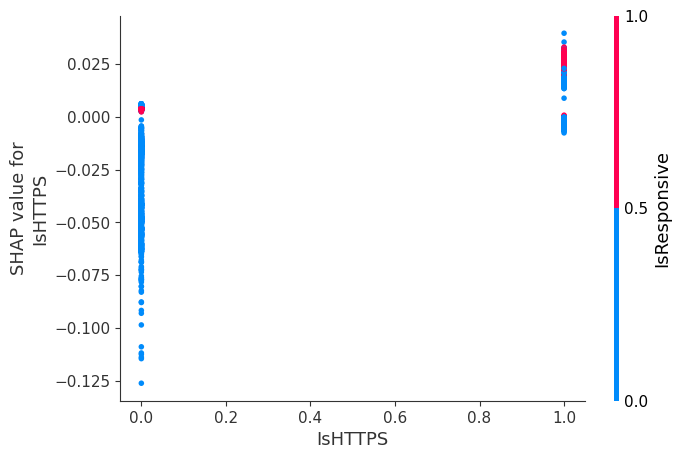

In [ ]:
shap.dependence_plot(
    top_features[3],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

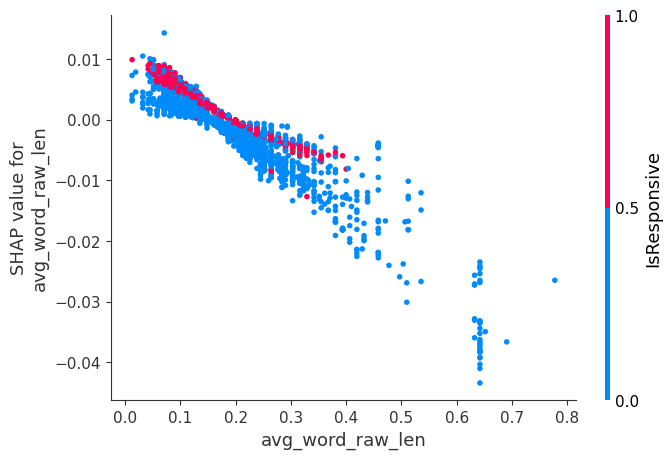

In [ ]:
shap.dependence_plot(
    top_features[4],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

In [ ]:
sample_idx = 44
prediction = CNN_model1.predict(X_test_balanced[sample_idx:sample_idx+1], verbose=0)
print(f"Model prediction for sample {sample_idx}: {prediction}")
print(f"True label: {'Benign (1)' if Y_test_balanced[sample_idx] == 1 else 'Phish (0)'}")

# Kiểm tra phân bố giá trị trong data
print(f"\nX_test_flat[{sample_idx}] statistics:")
print(f"Min: {X_test_flat[sample_idx].min()}")
print(f"Max: {X_test_flat[sample_idx].max()}")
print(f"Mean: {X_test_flat[sample_idx].mean()}")
print(f"Unique values: {np.unique(X_test_flat[sample_idx])[:10]}")  # 10 giá trị đầu

# Kiểm tra SHAP values
print(f"\nSHAP values for sample {sample_idx}:")
print(f"Min: {shap_values_reshaped[sample_idx].min()}")
print(f"Max: {shap_values_reshaped[sample_idx].max()}")
print(f"Mean: {shap_values_reshaped[sample_idx].mean()}")
print(f"Sum: {shap_values_reshaped[sample_idx].sum()}")

Model prediction for sample 44: [[0.99999845]]
True label: Benign (1)

X_test_flat[44] statistics:
Min: 0.0
Max: 1.0
Mean: 0.14079370050090312
Unique values: [0.         0.0004746  0.00076182 0.00135792 0.00143237 0.00158114
 0.00265957 0.00267977 0.00281478 0.00364716]

SHAP values for sample 44:
Min: -0.00022150887285103403
Max: 0.10814374234775703
Mean: 0.006175539533348678
Sum: 0.5002187022012429


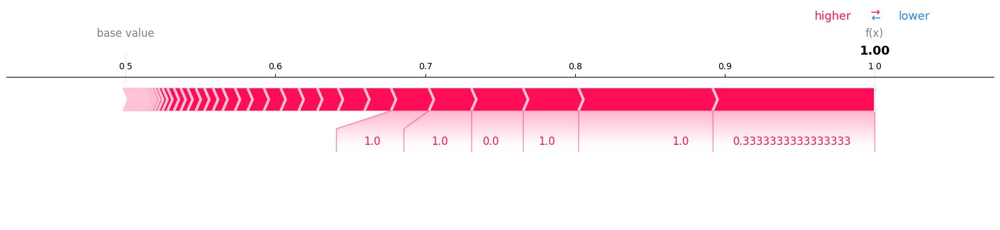

In [ ]:
shap.force_plot(
    base_value,
    shap_values_reshaped[sample_idx],
    X_test_flat[sample_idx],
    matplotlib=True
)

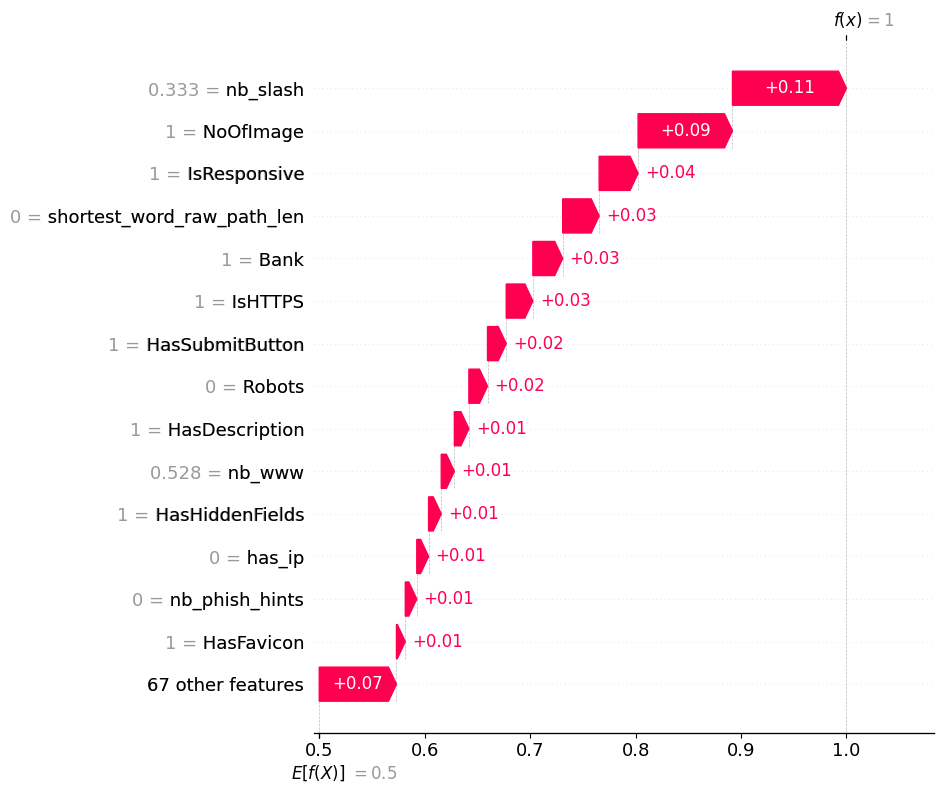

In [ ]:
explanation = shap.Explanation(
    values=shap_values_reshaped[sample_idx],
    base_values=base_value,
    data=X_test_flat[sample_idx],
    feature_names=real_feature_names
)

shap.plots.waterfall(explanation, max_display=15)

In [ ]:
abs_shap_sample = np.abs(shap_values_reshaped[sample_idx])
top_features = np.argsort(abs_shap_sample)[-6:][::-1]

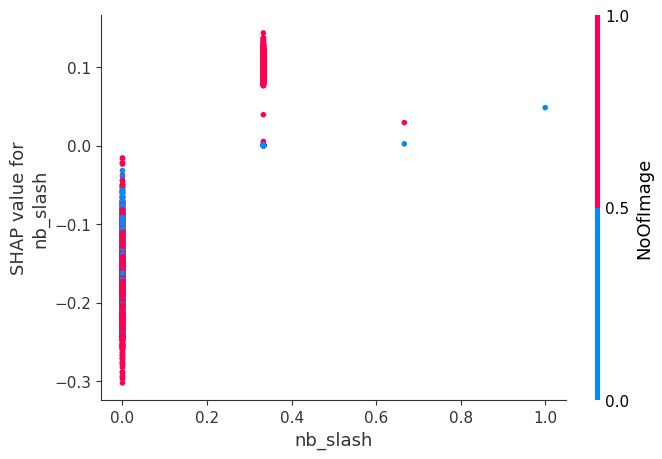

In [ ]:
shap.dependence_plot(
    top_features[0],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

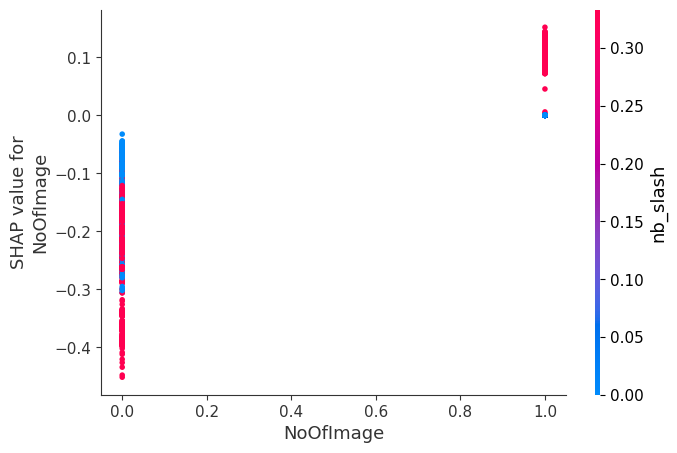

In [ ]:
shap.dependence_plot(
    top_features[1],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

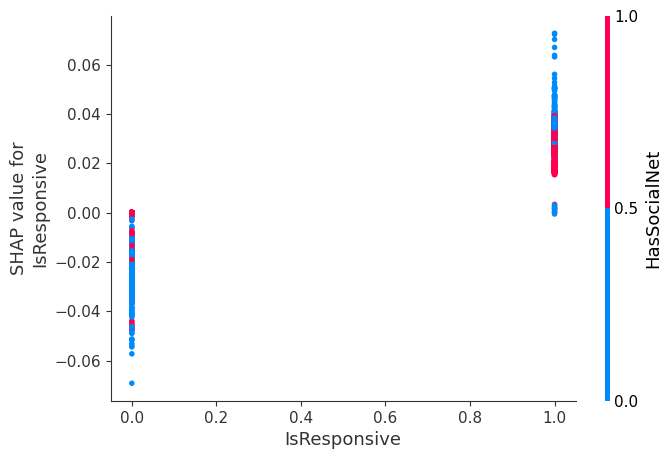

In [ ]:
shap.dependence_plot(
    top_features[2],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

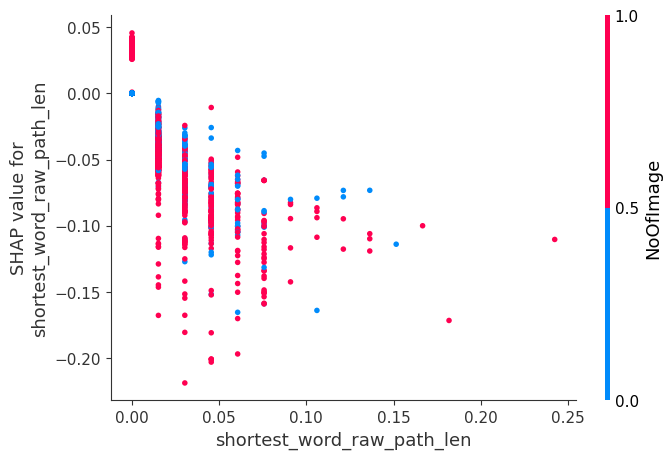

In [ ]:
shap.dependence_plot(
    top_features[3],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

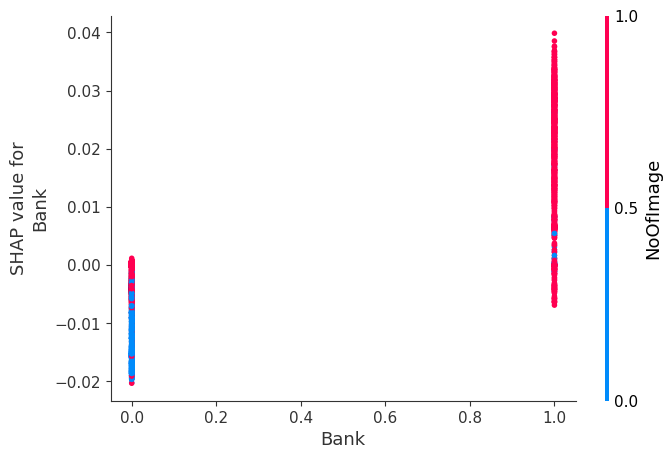

In [ ]:
shap.dependence_plot(
    top_features[4],
    shap_values_reshaped,
    X_test_flat,
    feature_names=feature_names,
    interaction_index='auto'
)

# Training & Evaluation CNN-LSTM With Numerical-Features

In [ ]:
import tensorflow as tf
CNN_LSTM_model1.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(curve='PR', name="pr_auc")
    ]
)

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        'PhiUSIIL_CNN_LSTM_Numerical.keras',
        verbose=1,
        save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=15,
        verbose=1
    )
]

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
Y_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")

CNN_LSTM_results_1 = CNN_LSTM_model1.fit(
    X_train3, Y_train3,
    validation_split=0.2,
    batch_size=128,
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200
981/985 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9994 - loss: 0.0021 - pr_auc: 0.9999 - precision: 0.9993 - recall: 0.9995
Epoch 1: val_loss improved from inf to 0.00153, saving model to PhiUSIIL_CNN_LSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 21s 14ms/step - accuracy: 0.9994 - loss: 0.0021 - pr_auc: 0.9999 - precision: 0.9993 - recall: 0.9995 - val_accuracy: 0.9994 - val_loss: 0.0015 - val_pr_auc: 0.9999 - val_precision: 0.9993 - val_recall: 0.9996
Epoch 2/200
985/985 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9994 - loss: 0.0017 - pr_auc: 1.0000 - precision: 0.9993 - recall: 0.9996
Epoch 2: val_loss improved from 0.00153 to 0.00134, saving model to PhiUSIIL_CNN_LSTM_Numerical.keras
985/985 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9994 - loss: 0.0017 - pr_auc: 1.0000 - precision: 0.9993 - recall: 0.9996 - val_accuracy: 0.9995 - val_loss: 0.0013 - val_pr_auc: 0.9999 - val_precision: 0.9992 - val_recall: 0.9998
Epoch 3/200
984/985 ━━━━━━━━━━━━━━━━━━

In [ ]:
#CNN_LSTM_results_1 = tf.keras.models.load_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_LSTM_Numerical.keras")

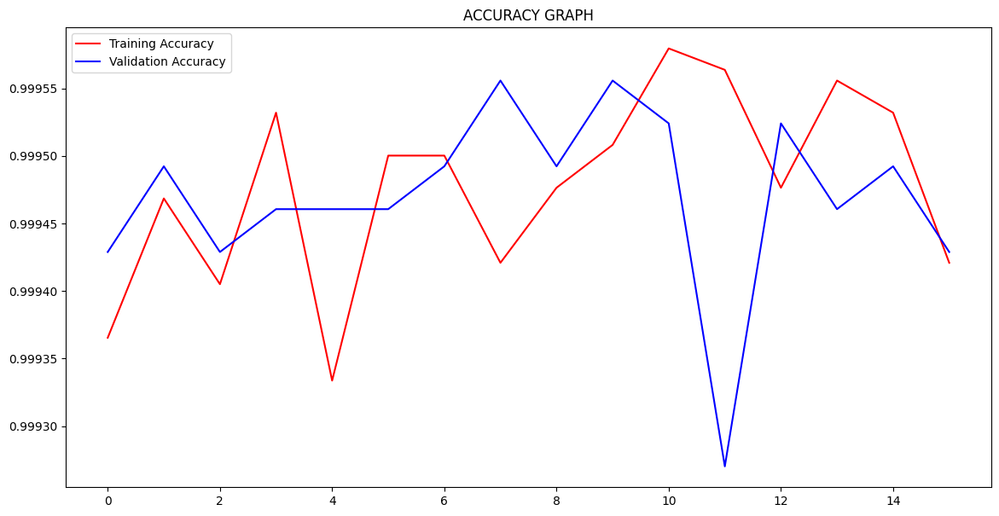

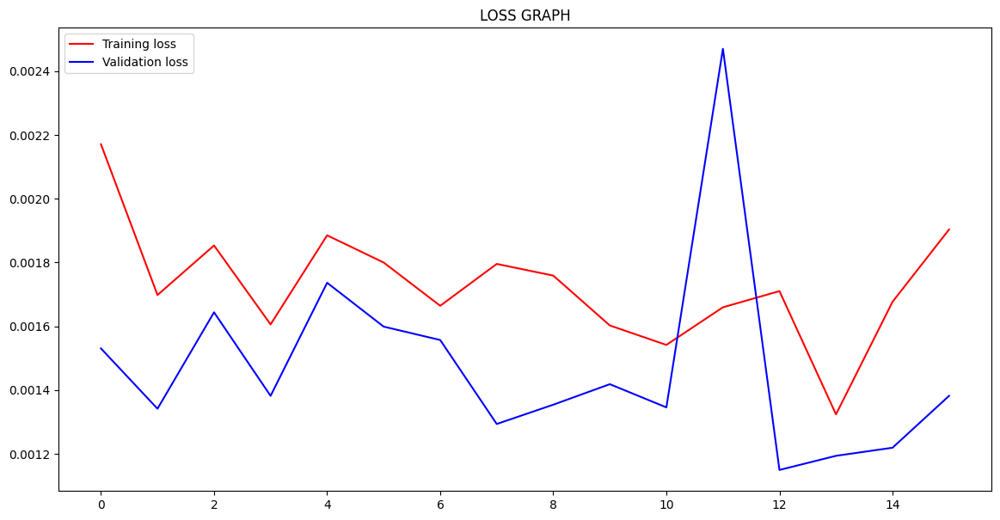

In [ ]:
eval_graph_CNN(CNN_LSTM_results_1)

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


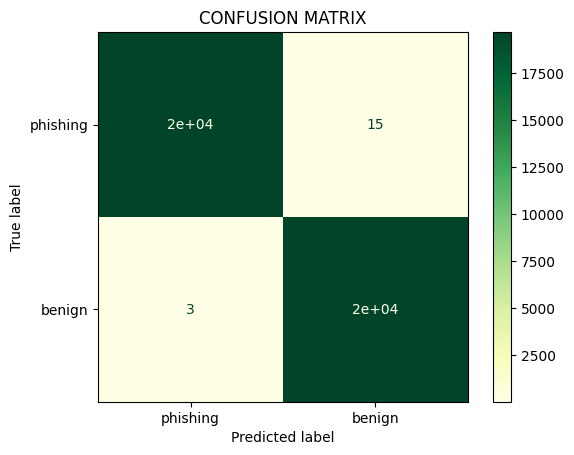

F1-Score: 0.9995


In [ ]:
conf_matrix_CNN(X_test3, Y_test3, CNN_LSTM_model1, label_names=['phishing', 'benign'])

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step


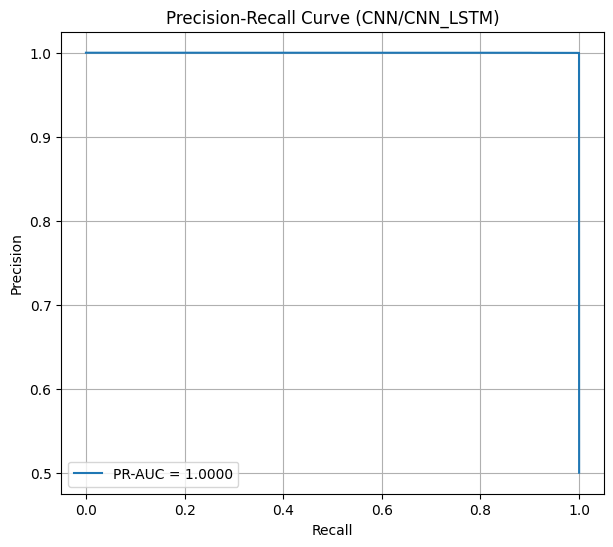

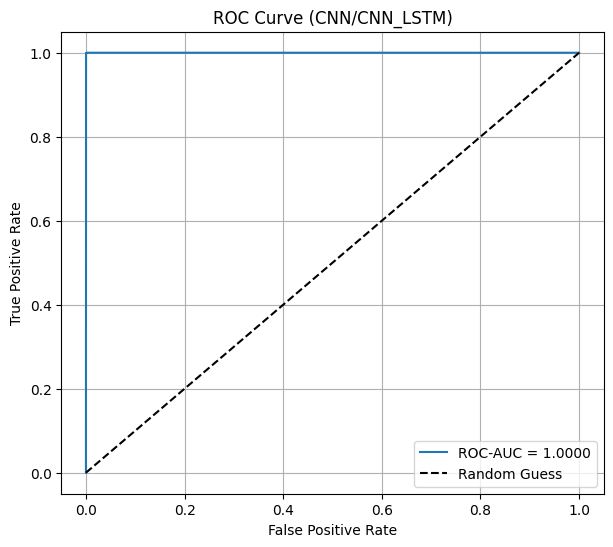

PR-AUC : 1.0000
ROC-AUC: 1.0000


(np.float64(0.9999735525882497), np.float64(0.9999774900490361))

In [ ]:
pr_roc_CNN(X_test3, Y_test3, CNN_LSTM_model1)

In [ ]:
!mv /content/PhiUSIIL_CNN_LSTM_Numerical.keras /content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_LSTM_Numerical.keras

# CNN_LSTM Explain Using LIME (Numerical)

In [ ]:
from lime import lime_tabular
import tensorflow as tf
import numpy as np

X_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_train3.npy")
X_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/X_test3.npy")
Y_test3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_test3.npy")
Y_train3 = np.load("/content/drive/MyDrive/DeAnTotNghiep/Y_train3.npy")
feature_names = np.load("/content/drive/MyDrive/DeAnTotNghiep/feature_names.npy", allow_pickle=True).tolist()
CNN_LSTM_model1 = tf.keras.models.load_model("/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_LSTM_Numerical.keras")

In [ ]:
# Flatten input từ (81, 1) -> (81,)
X_train_flat = X_train3.reshape(X_train3.shape[0], -1)
X_test_flat = X_test3.reshape(X_test3.shape[0], -1)

In [ ]:
def predict_proba(x):
    x_reshaped = x.reshape(x.shape[0], 64, 1)
    p_benign = CNN_LSTM_model1.predict(x_reshaped, verbose=0)
    p_phish = 1 - p_benign
    return np.concatenate([p_phish, p_benign], axis=1)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    X_train_flat,
    feature_names=feature_names,
    class_names=['Phishing', 'Benign'],
    mode='classification'
)

In [ ]:
exp = explainer.explain_instance(
    X_test_flat[57],
    predict_proba,
    num_features=20,
    num_samples=5000
)
exp.show_in_notebook(show_table=True)

In [ ]:
Y_test3[57]

np.int64(1)

In [ ]:
exp.save_to_file('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_LSTM_NUMERICAL_LIME/sample_57_explaination.html')

In [ ]:
exp = explainer.explain_instance(
    X_test_flat[11],
    predict_proba,
    num_features=20,
    num_samples=5000
)
exp.show_in_notebook(show_table=True)

In [ ]:
Y_test3[11]

np.int64(0)

In [ ]:
exp.save_to_file('/content/drive/MyDrive/DeAnTotNghiep/PhiUSIIL_CNN_LSTM_NUMERICAL_LIME/sample_11_explaination.html')